# Introduction

This notebook contains all of the analysis code used to generate the tables and figures in the Language Model Council paper: https://arxiv.org/abs/2406.08598.

If you encounter any issues with this notebook, file a github issue at https://github.com/llm-council/llm-council.

# Setup

```
git clone git@github.com:llm-council/llm-council.git
cd llm-council

pip install -r requirements.txt
```

## Read data

There are 4 subsets of the LMC-EA dataset (https://huggingface.co/datasets/llm-council/emotional_application):

- test_set_formulation: Synthetic expansions of the EmoBench EA dataset, generated by 20 different LLMs. Each expansion is a detailed story describing an interpersonal conflict, written in the first person.
- response_collection: Conversational responses to 100 interpersonal conflicts, from 20 different LLMs. The prompt to an LLM for a conversational response requests that the response is at most 250 words in response length.
- response_judging: LLM ratings for pairwise comparisons for every non-reference LLM’s response vs. the reference LLM’s response, for each interpersonal conflict, from each LLM judge. To mitigate position bias, we adopt a two-game setup, swapping model positions per query.
- response_judging_human: Ratings for pairwise comparisons for a subset of 9 LLMs and 120 randomly sampled dilemma-response tuples. We recruited a total of 142 participants.

In [4]:
from datasets import load_dataset
from llm_council.analysis.visualization import plot_heatmap

dataset = load_dataset("llm-council/emotional_application", "response_judging")
judging_df = dataset["council"].to_pandas()

dataset = load_dataset("llm-council/emotional_application", "response_collection")
respondents_df = dataset["council"].to_pandas()

In [3]:
respondents_df

,emobench_id,problem,relationship,scenario,detailed_dilemma,response_string,llm_responder
0,119,Self,Personal,"Leah had a big fight with her best friend, and...","Two weeks ago, I had a huge fall-out with my b...",It's clear that you value this friendship and ...,command-r-plus
1,18,Interpersonal,Personal,Bella is overseas when she finds out that her ...,I was abroad when I received the news of my fa...,I'm so sorry for your loss. Losing a parent is...,command-r-plus
2,92,Interpersonal,Social,One of Erin's classmates is thought to be extr...,Here is the expanded interpersonal conflict fo...,It's great that Alex felt comfortable enough t...,command-r-plus
3,13,Interpersonal,Personal,Katerina takes a long time to turn on putting ...,"I'm Katerina, and I love spending family movie...","Katerina, it's completely understandable that ...",command-r-plus
4,88,Interpersonal,Social,"At a company meeting, Sally got into an argume...",Here is a 300-word story expanding on the inte...,It's completely valid to feel annoyed and slig...,command-r-plus
...,...,...,...,...,...,...,...
3995,110,Self,Personal,Jenny's sister has been borrowing money from h...,"I've always been close to my younger sister, E...",I understand how challenging this situation mu...,gpt-4-turbo-2024-04-09
3996,25,Interpersonal,Personal,Eileen has been diagnosed with a terminal dise...,The silence that followed the crash of my phon...,I'm truly sorry to hear about the emotional an...,gpt-4-turbo-2024-04-09
3997,197,Self,Social,Frank and his team gave the proposal presentat...,"As the team leader, I was proud of the proposa...",It's important to address concerns about feedb...,gpt-4-turbo-2024-04-09
3998,124,Self,Personal,"After a very tough breakup, Nathan is struggli...","After the breakup, the silence was deafening. ...",I'm truly sorry to hear about your struggles. ...,gpt-4-turbo-2024-04-09


In [4]:
judging_df

,emobench_id,llm_judge,judging_response_string,first_completion_by,second_completion_by,pairwise_choice
0,100,command-r-plus,Explanation: Both responses demonstrate empath...,qwen1.5-32B-Chat,gpt-4o-2024-05-13,B>A
1,102,command-r-plus,Explanation: Both responses exhibit authentici...,claude-3-sonnet,qwen1.5-32B-Chat,B>A
2,100,command-r-plus,Both responses demonstrate empathy and a clear...,llama-3-70b-chat,qwen1.5-32B-Chat,A>B
3,100,command-r-plus,Both responses demonstrate empathy and offer a...,qwen1.5-32B-Chat,command-r,A>B
4,102,command-r-plus,Explanation: Both responses exhibit authentici...,qwen1.5-32B-Chat,gemini-1.0-pro,B>A
...,...,...,...,...,...,...
75995,199,gpt-4-turbo-2024-04-09,Both responses offer empathetic and actionable...,qwen1.5-32B-Chat,claude-3-haiku,A>B
75996,199,gpt-4-turbo-2024-04-09,Both responses offer thoughtful advice and dem...,gpt-3.5-turbo-0125,qwen1.5-32B-Chat,B>A
75997,199,gpt-4-turbo-2024-04-09,Both responses provide thoughtful and empathet...,qwen1.5-32B-Chat,gpt-4o-2024-05-13,A>B
75998,199,gpt-4-turbo-2024-04-09,Both responses offer thoughtful and empathetic...,qwen1.5-32B-Chat,gpt-4-turbo-2024-04-09,A>B


## Define output directories

There are many different dimensions of analysis, so let's define some output directories as to give our analysis artifacts a place to be saved.

In [5]:
import os
from collections import defaultdict


analysis_outdir = "analysis/lmc_notebook"

analysis_consistent_votes_outdir = os.path.join(analysis_outdir, "consistent_votes")
analysis_all_votes_outdir = os.path.join(analysis_outdir, "all_votes")

os.makedirs(analysis_outdir, exist_ok=True)

analysis_subdirectories = [
    "bradley_terry",
    "explicit_win_rates",
    "agreement",
    "length_bias",
    "consistency_and_position_bias",
    "affinity",
    "rankings_and_separability",
]

# Store all subdirectories in a map.
analysis_subdir_map = defaultdict(dict)

# Make all subdirectories.
for subdir in analysis_subdirectories:
    all_votes_subdir = os.path.join(analysis_all_votes_outdir, subdir)
    consistent_votes_subdir = os.path.join(analysis_consistent_votes_outdir, subdir)

    os.makedirs(all_votes_subdir, exist_ok=True)
    os.makedirs(consistent_votes_subdir, exist_ok=True)

    analysis_subdir_map["consistent_votes"][subdir] = consistent_votes_subdir
    analysis_subdir_map["all_votes"][subdir] = all_votes_subdir


# Getting consistent votes

In the two-game setup, we gather ratings for models in both positions during pairwise comparisons, allowing us to identify and potentially remove inconsistent ratings before calculating ELO scores.

In [23]:
from llm_council.analysis.pairwise.consistency import get_consistent_votes

consistent_judging_df = get_consistent_votes(judging_df)

# Estimated win rates (Bradley-Terry)

Following Chatbot Arena Hard, we can use Bradley-Terry to calculate estimated win rates derived from ELO scores.

In [14]:
from llm_council.analysis.pairwise.bradley_terry import bradley_terry_analysis

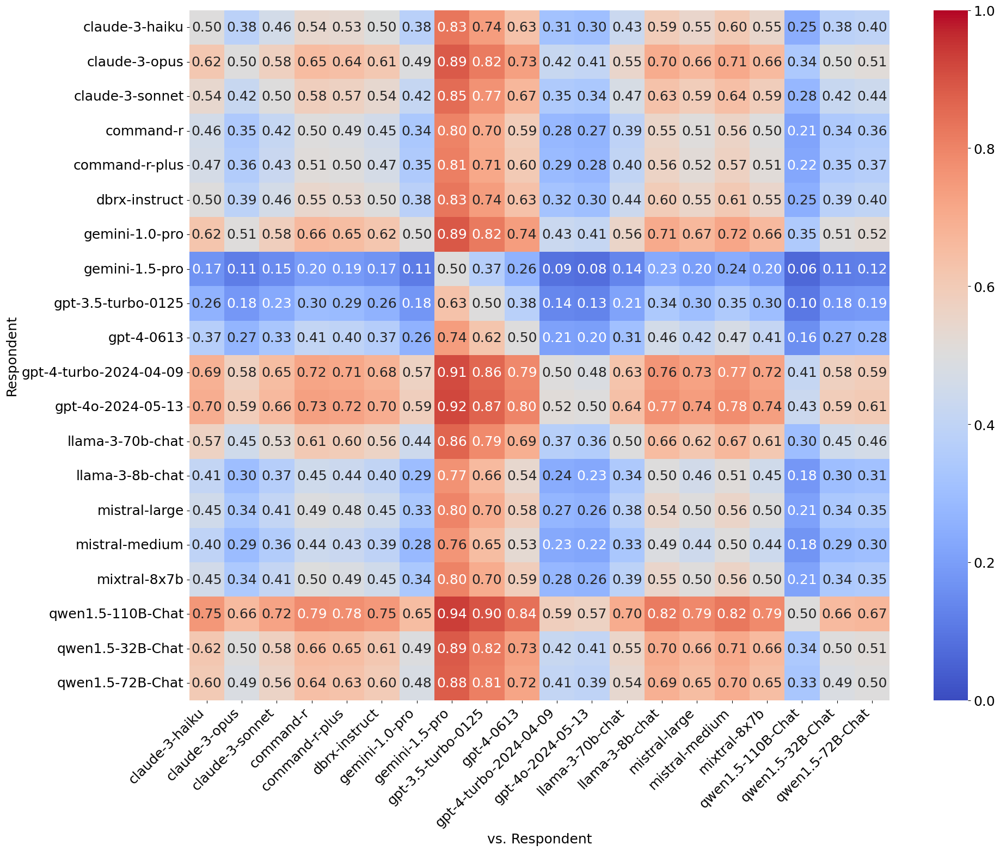

In [15]:
# For all votes.
expected_win_rate_map = bradley_terry_analysis(judging_df)

plot_heatmap(
    expected_win_rate_map,
    ylabel="Respondent",
    xlabel="vs. Respondent",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["all_votes"]["bradley_terry"], "llm_vs_llm_win_rates.pdf"),
    font_size=18,
)

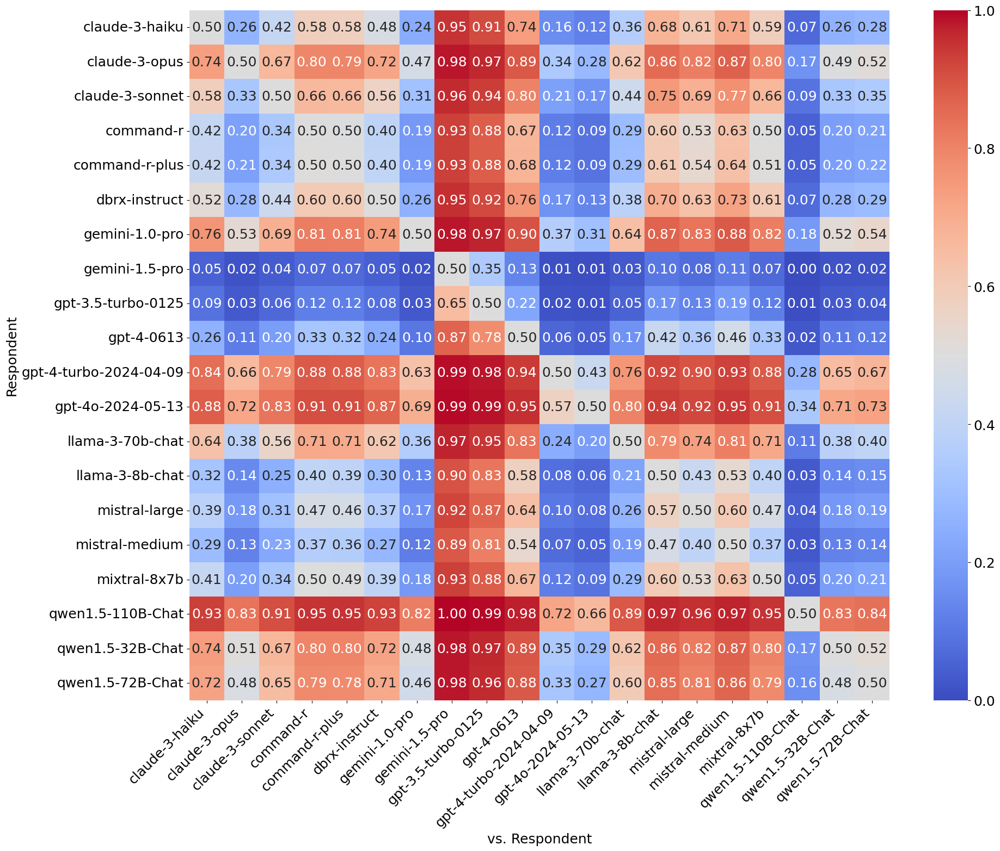

In [16]:
# For only consistent votes.
expected_win_rate_map = bradley_terry_analysis(consistent_judging_df)

plot_heatmap(
    expected_win_rate_map,
    ylabel="Respondent",
    xlabel="vs. Respondent",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["consistent_votes"]["bradley_terry"], "llm_vs_llm_win_rates.pdf"),
    font_size=18,
)

## Explicit Win Rate

What are the exact win rates? With one reference model, this isn't particularly insightful, but for dataframes where there are multiple reference models, then this would be more interesting.

In [18]:
from llm_council.analysis.pairwise.explicit_win_rate import get_explicit_win_rates

explicit_win_rates_df = get_explicit_win_rates(judging_df)
explicit_win_rates_consistent_df = get_explicit_win_rates(consistent_judging_df)

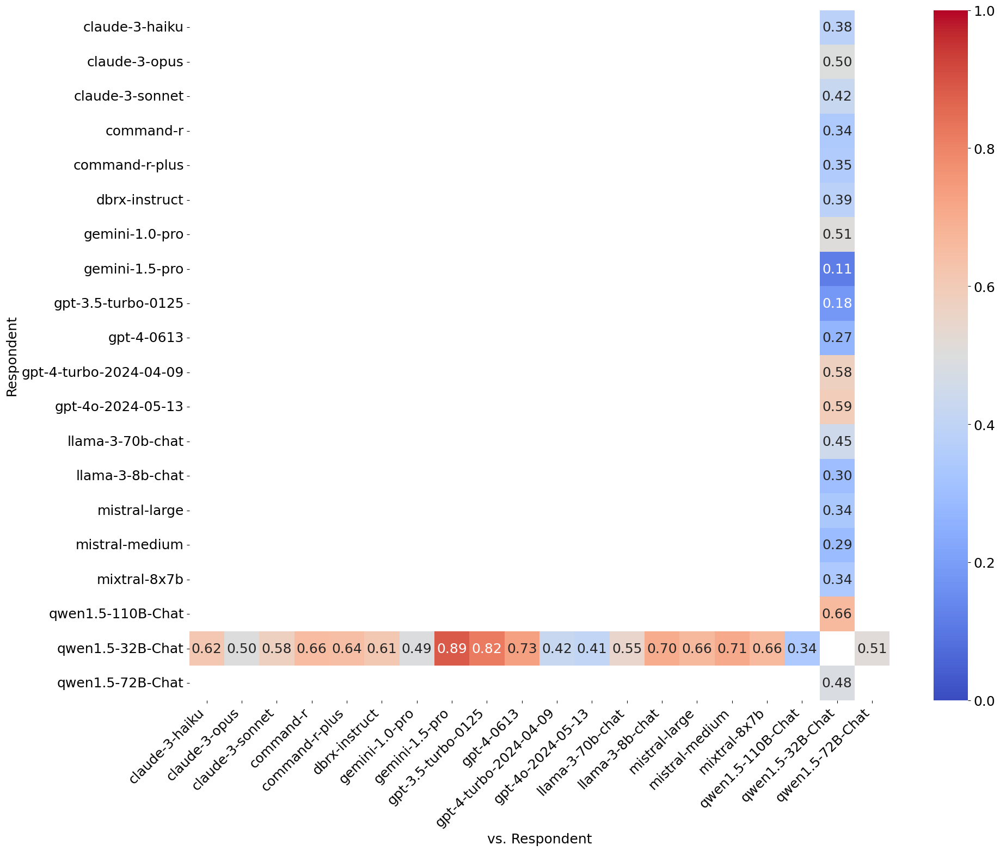

In [19]:
plot_heatmap(
    df=explicit_win_rates_df,
    outfile=os.path.join(analysis_subdir_map["all_votes"]["explicit_win_rates"], "llm_explicit_win_rate.pdf"),
    ylabel="Respondent",
    xlabel="vs. Respondent",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
)

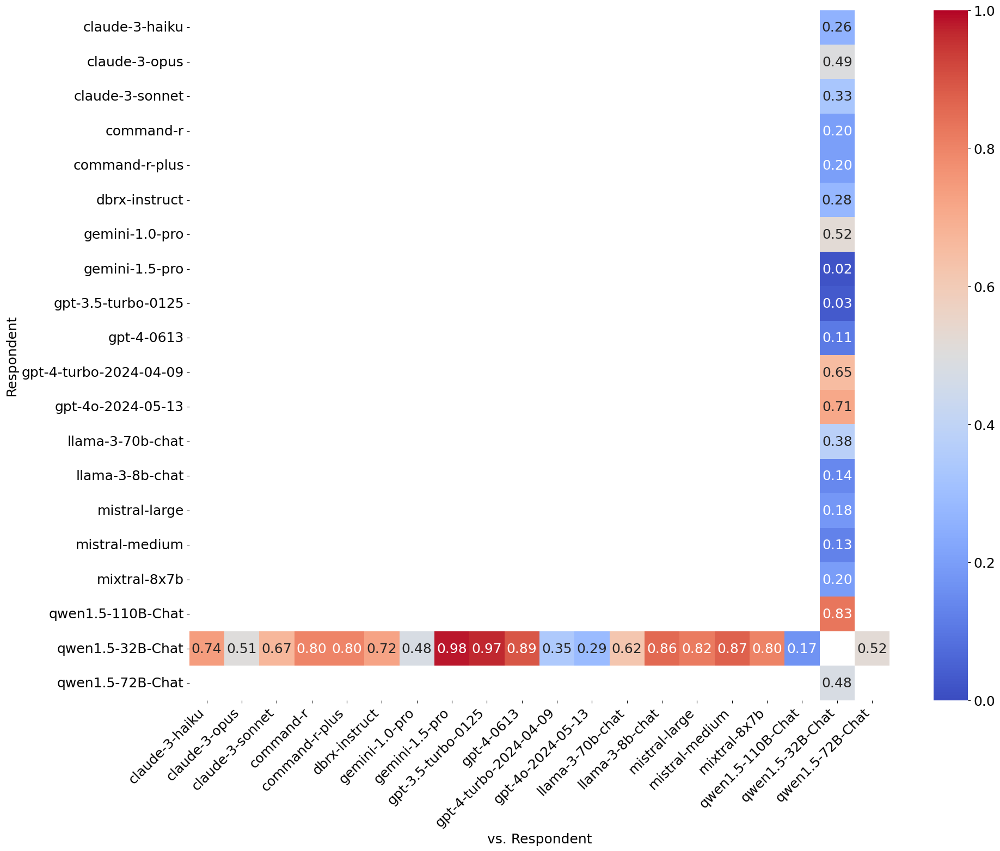

In [20]:
plot_heatmap(
    df=explicit_win_rates_consistent_df,
    outfile=os.path.join(analysis_subdir_map["consistent_votes"]["explicit_win_rates"], "llm_explicit_win_rate.pdf"),
    ylabel="Respondent",
    xlabel="vs. Respondent",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
)

# Judge agreement

Which LLMs agree with which other LLMs and how much?

Below, we plot a heatmap for each agreement method, of which we compute 4 different metrics: cohen's kappa, exact, sidewise-exact, and sidewise cohen's kappa.

## Get an agreement map

In [21]:
from llm_council.analysis.pairwise.agreement import get_judge_agreement_map

In [33]:
judge_agreement_map = get_judge_agreement_map(judging_df)
judge_agreement_map_consistent = get_judge_agreement_map(consistent_judging_df)

## Find mean agreement

In [34]:
import pandas as pd

# Find mean agreement over all votes.
mean_agreement = {}
for agreement_method, judge_agreement_df in judge_agreement_map.items():
    mean_agreement[agreement_method] = judge_agreement_df.mean()
mean_agreement = pd.DataFrame(mean_agreement)

# Find mean agreement over consistent votes.
mean_agreement_consistent_votes = {}
for agreement_method, judge_agreement_df in judge_agreement_map_consistent.items():
    mean_agreement_consistent_votes[agreement_method] = judge_agreement_df.mean()
mean_agreement_consistent_votes = pd.DataFrame(mean_agreement_consistent_votes)

In [35]:
mean_agreement

,cohen_kappa,exact,sidewise,sidewise_cohen_kappa
claude-3-haiku,0.199704,0.549223,0.633709,0.242601
claude-3-opus,0.292482,0.588020,0.667907,0.336030
claude-3-sonnet,0.136425,0.471867,0.569987,0.185941
command-r,0.123831,0.432506,0.605602,0.228862
command-r-plus,0.242829,0.569160,0.655025,0.288756
dbrx-instruct,0.221782,0.558847,0.645652,0.269935
gemini-1.0-pro,0.117523,0.466942,0.548133,0.142745
gemini-1.5-pro,0.232930,0.539298,0.615990,0.271701
gpt-3.5-turbo-0125,0.159671,0.473120,0.648396,0.277467
gpt-4-0613,0.261736,0.571554,0.666266,0.312530


## Plot heatmaps

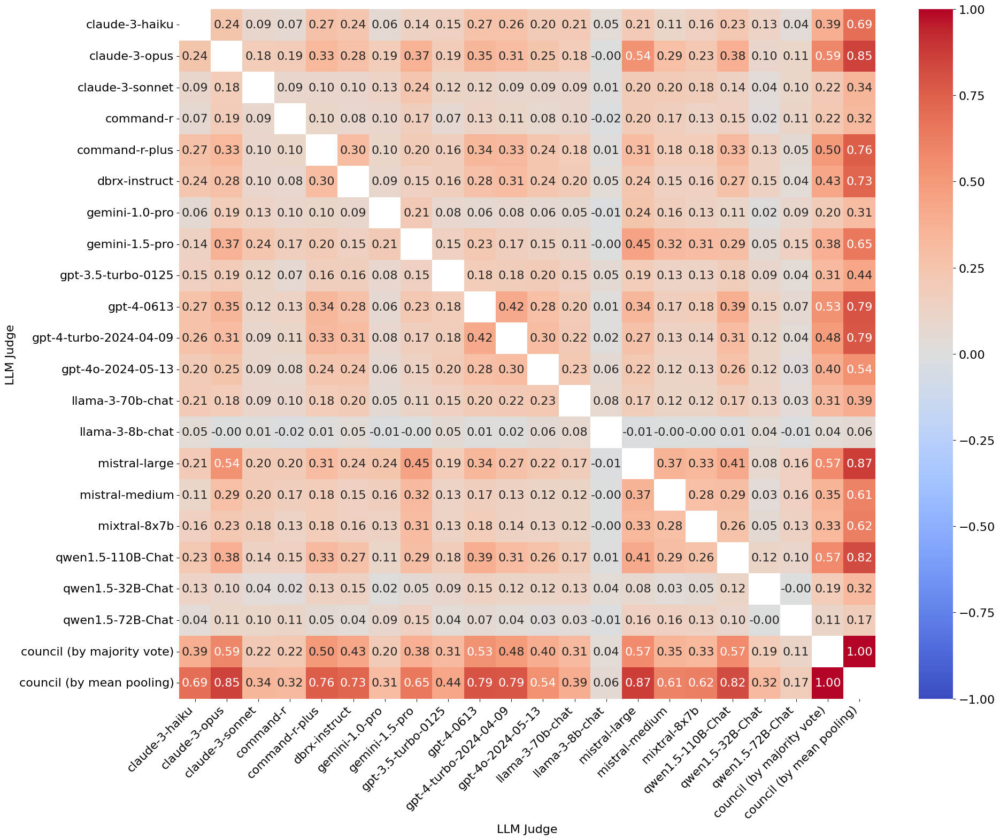

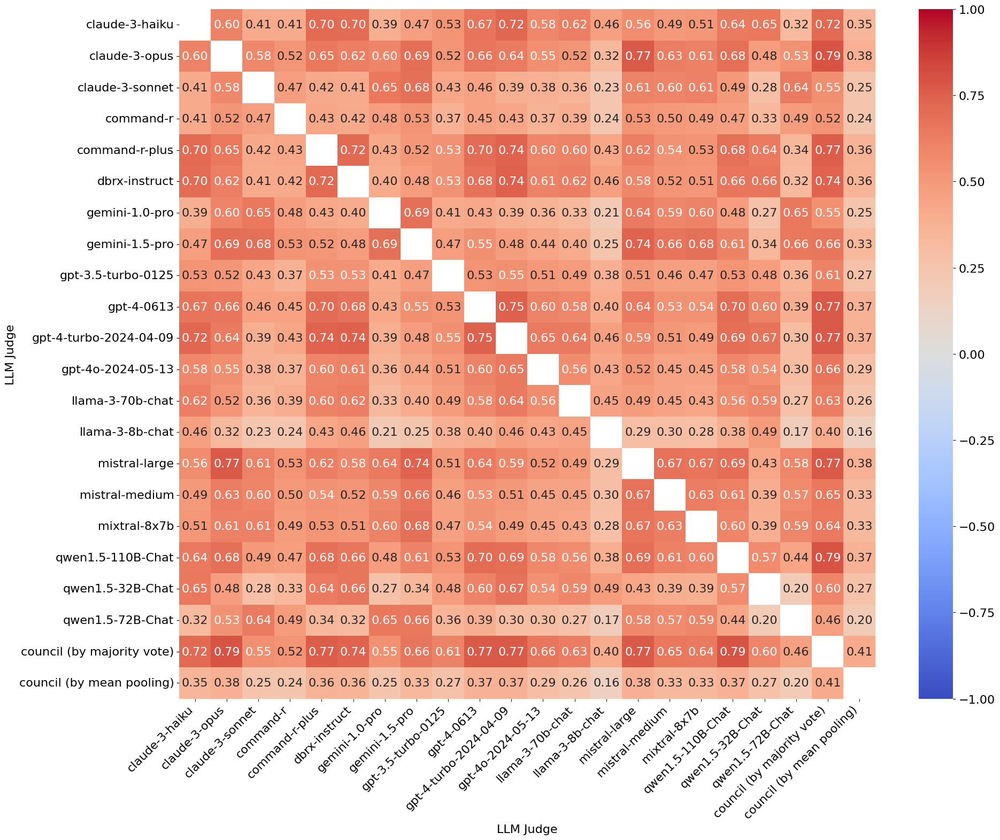

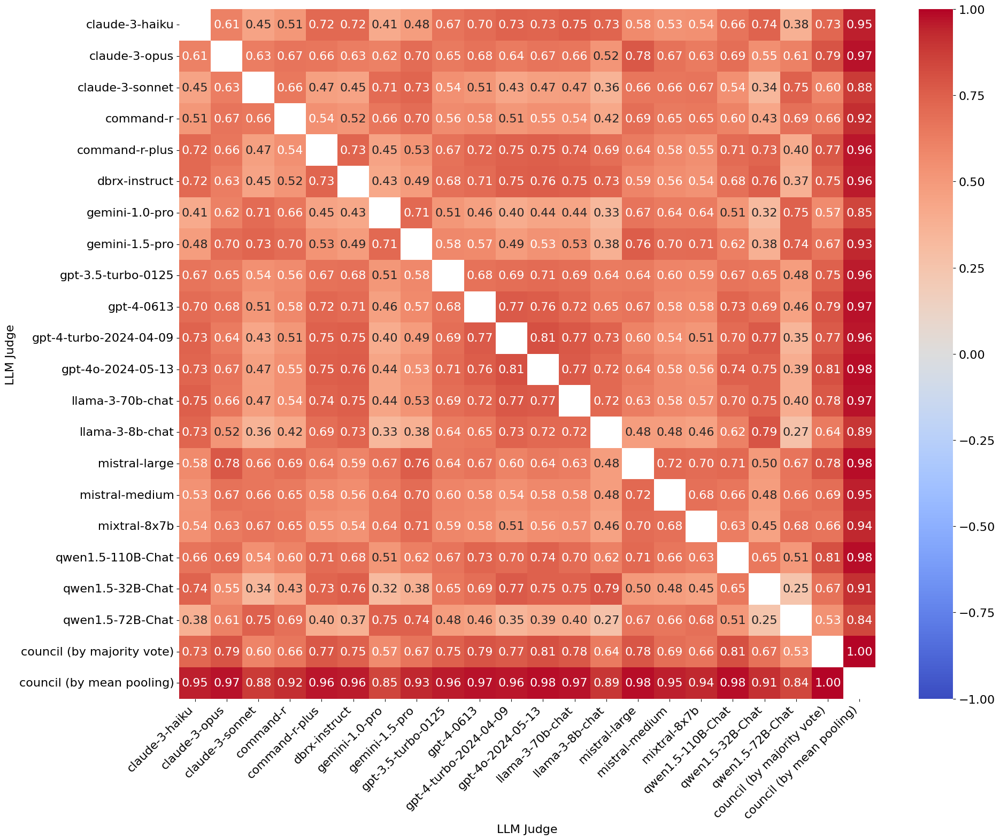

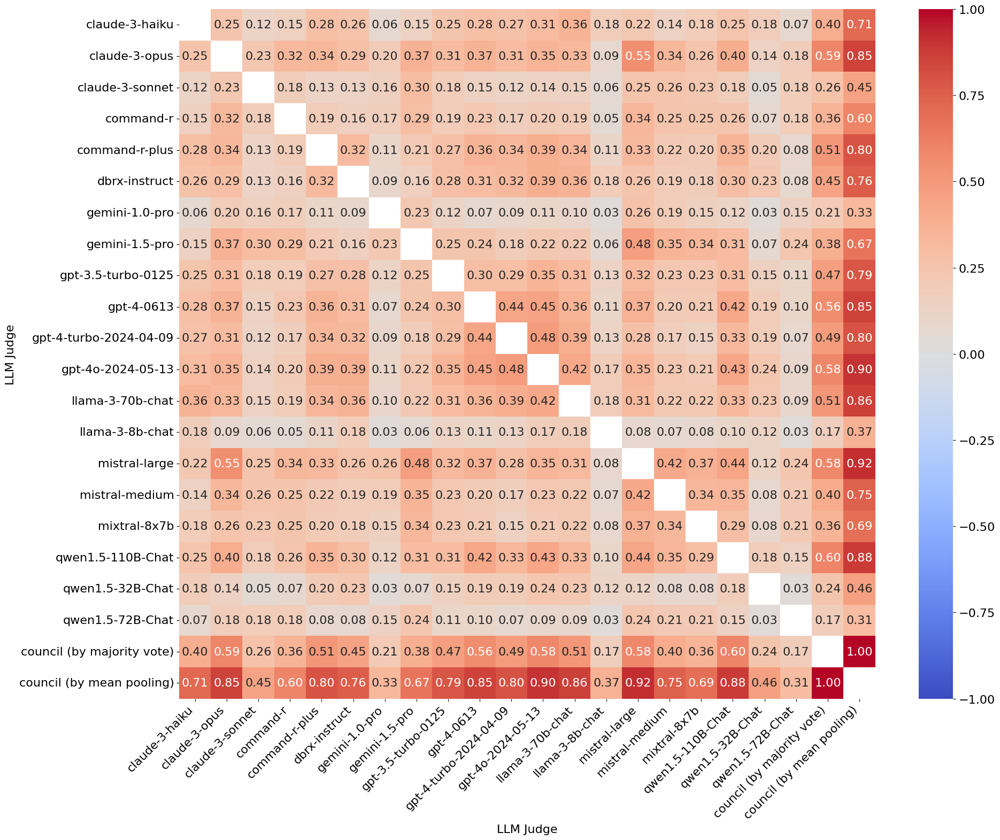

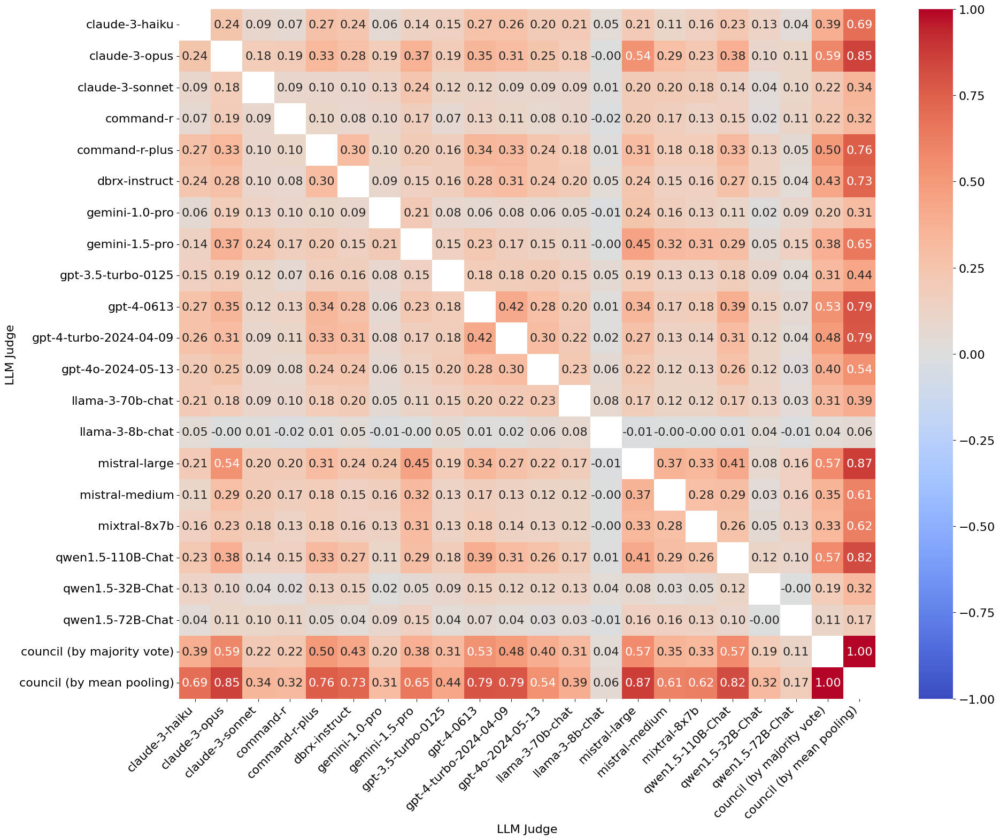

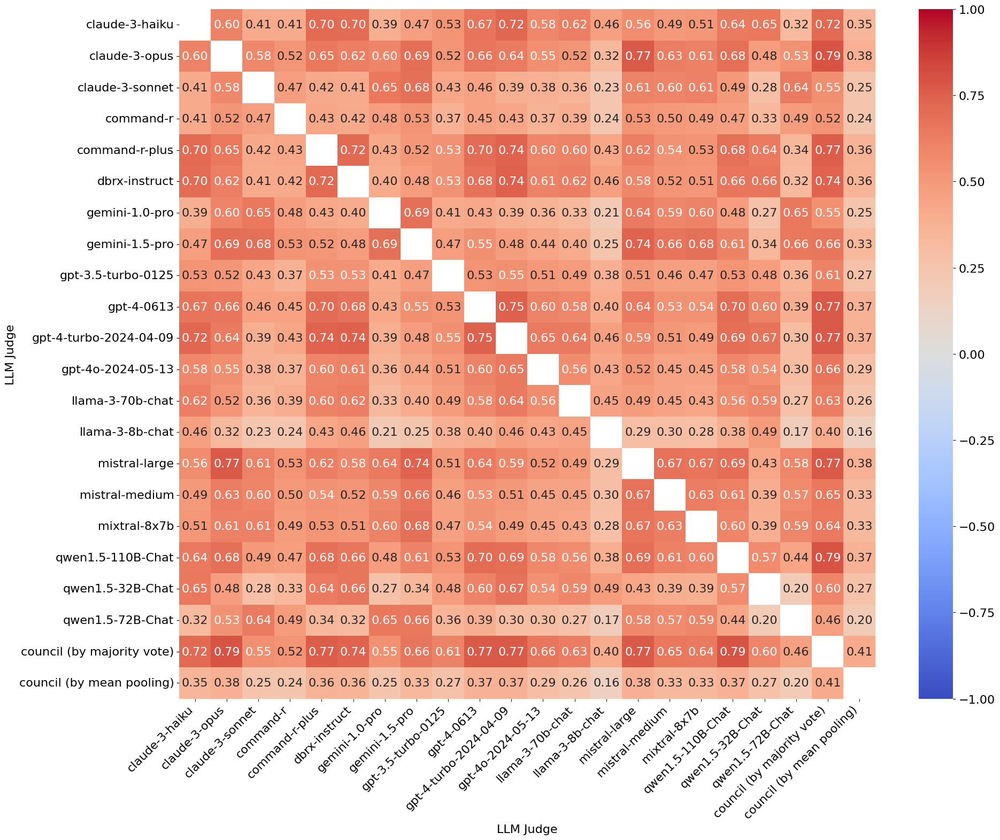

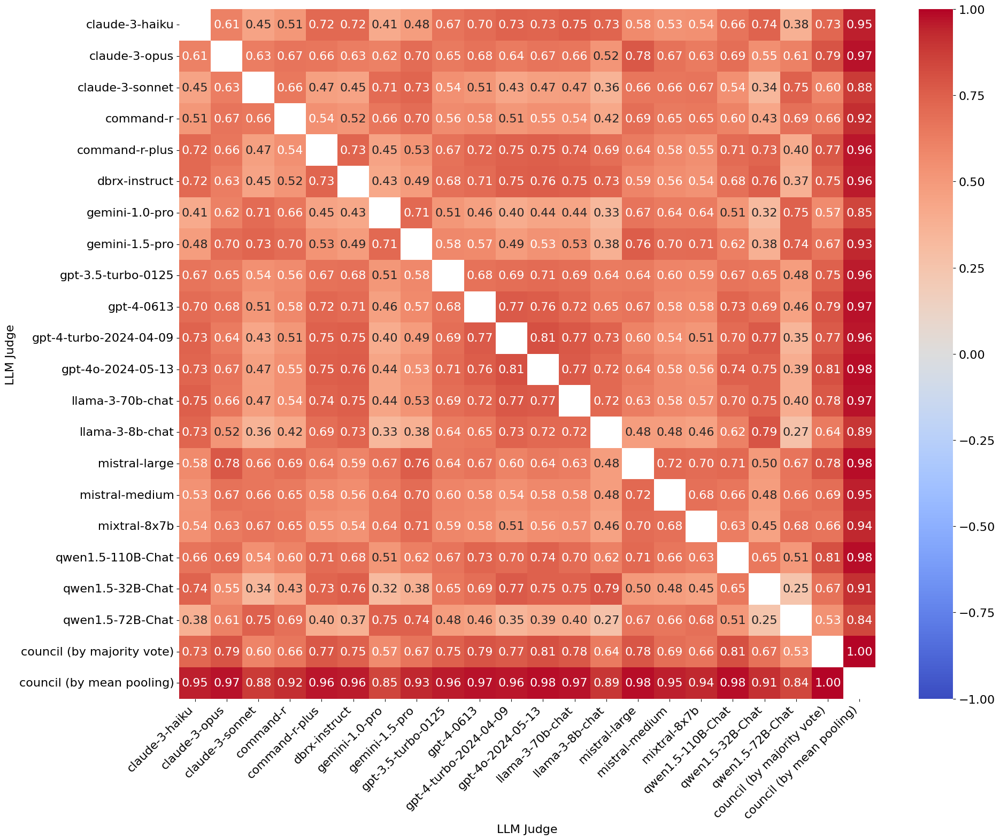

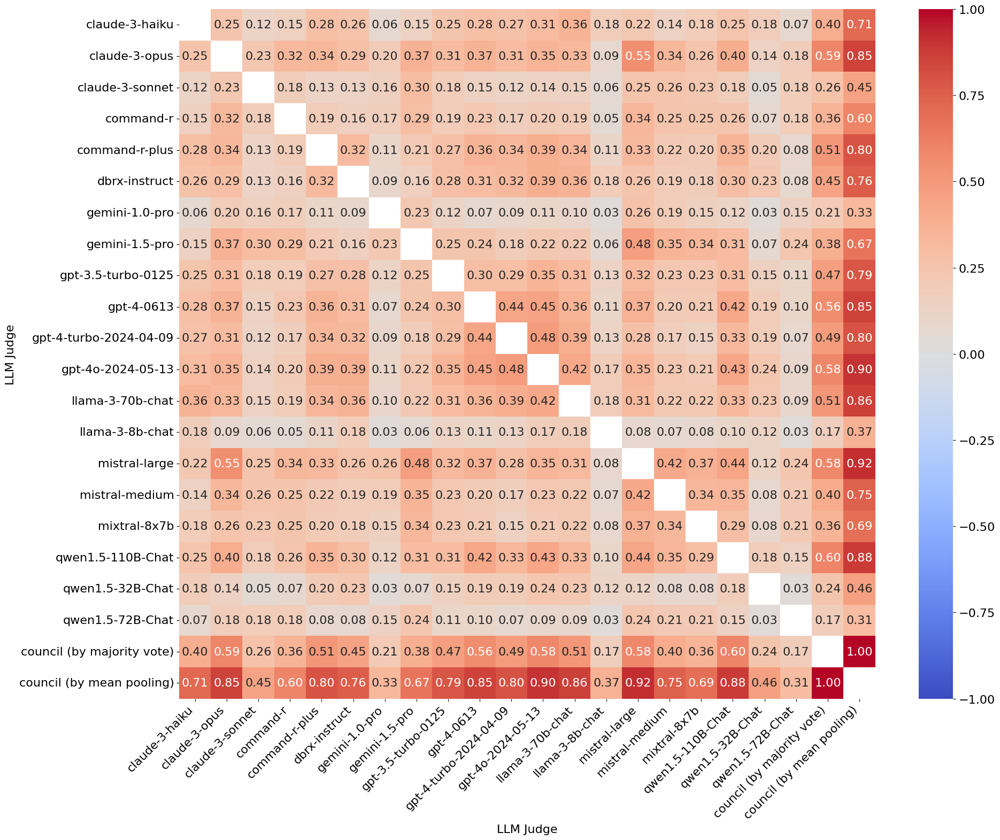

In [37]:
# Heatmaps for agreement amongst all votes.
for agreement_method in judge_agreement_map.keys():
    plot_heatmap(
        df=judge_agreement_map[agreement_method],
        outfile=os.path.join(analysis_subdir_map["all_votes"]["agreement"], f"judge_agreement.{agreement_method}.pdf"),
        ylabel="LLM Judge",
        xlabel="LLM Judge",
        vmin=-1,
        vmax=1,
        font_size=16,
    )


# Heatmaps for agreement amongst consistent votes.
for agreement_method in judge_agreement_map_consistent.keys():
    plot_heatmap(
        df=judge_agreement_map[agreement_method],
        outfile=os.path.join(analysis_subdir_map["consistent_votes"]["agreement"], f"judge_agreement.{agreement_method}.pdf"),
        ylabel="LLM Judge",
        xlabel="LLM Judge",
        vmin=-1,
        vmax=1,
        font_size=16,
    )

# Length bias

How predictive is the length of a response (or difference in length of a pair of responses) in determining the final judging outcome?

## Library functions

In [46]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from llm_council.analysis.pairwise.length_bias import attach_num_words_to_judging_df
from llm_council.constants import (
    MAJOR_A_WIN,
    MINOR_A_WIN,
    MINOR_B_WIN,
    MAJOR_B_WIN,
    TIE,
)
import os


def plot_length_based_outcomes(
    judging_df, name, id_respondent_to_num_words, show=True, outdir=None
):
    """Creates a plot with X and Y axes as the response lengths of the battlers, and the color indicating the result of the battle."""
    # Attach num words to judging_df.
    attach_num_words_to_judging_df(judging_df, id_respondent_to_num_words)

    # Apply colors.
    def get_color(row):
        if row["pairwise_choice"] == MINOR_A_WIN:
            return "teal"
        if row["pairwise_choice"] == MINOR_B_WIN:
            return "orange"
        if row["pairwise_choice"] == MAJOR_A_WIN:
            return "blue"
        if row["pairwise_choice"] == MAJOR_B_WIN:
            return "red"
        return "yellow"

    judging_df.loc[:, "color"] = judging_df.apply(get_color, axis=1)

    # Filter out ties, as they cause a lot of noise.
    filtered_df = judging_df[judging_df["color"] != "yellow"]

    plt.figure(figsize=(10, 10))
    plt.scatter(
        filtered_df["second_completion_by_num_words"],  # X-axis data
        filtered_df["first_completion_by_num_words"],  # Y-axis data
        color=filtered_df["color"],  # Color by the 'color' column
        alpha=0.1,  # Set transparency
    )

    max_value = max(
        filtered_df["first_completion_by_num_words"].max(),
        filtered_df["second_completion_by_num_words"].max(),
    )
    min_value = min(
        filtered_df["first_completion_by_num_words"].min(),
        filtered_df["second_completion_by_num_words"].min(),
    )
    plt.plot(
        [min_value, max_value],
        [min_value, max_value],
        "k--",
        label="Equal # tokens",
    )  # 'k--' specifies a black dashed line

    plt.title(f"LLM Judge Outcomes ({name})")
    plt.xlabel("# Words (Respondent B)")
    plt.ylabel("# Words (Respondent A)")
    plt.grid(True)

    # Add custom legend for colors
    legend_handles = [
        mpatches.Patch(color="blue", label="Major A Win"),
        mpatches.Patch(color="teal", label="Minor A Win"),
        mpatches.Patch(color="orange", label="Minor B Win"),
        mpatches.Patch(color="red", label="Major B Win"),
    ]
    plt.legend(handles=legend_handles)

    plt.tight_layout()

    if outdir:
        plt.savefig(os.path.join(outdir, f"{name}.pdf"))

    if show:
        plt.show()
    plt.close()


## Get a count of each of the respondent's responses.

In [45]:
from llm_council.analysis.pairwise.length_bias import get_respondent_token_counts

respondent_to_token_counts_df, id_respondent_to_num_words = get_respondent_token_counts(respondents_df)

In [40]:
respondent_to_token_counts_profile = respondent_to_token_counts_df.describe().T
formatted_series = (
    respondent_to_token_counts_profile["mean"].astype(int).astype(str)
    + " ± "
    + respondent_to_token_counts_profile["std"].astype(int).astype(str)
)
print("Respondent token counts (words):")
print("--------------------------------")
print(formatted_series)

Respondent token counts (words):
--------------------------------
command-r-plus            222 ± 16
command-r                 227 ± 15
dbrx-instruct             233 ± 13
qwen1.5-110B-Chat         233 ± 17
qwen1.5-72B-Chat          236 ± 11
qwen1.5-32B-Chat          236 ± 11
llama-3-70b-chat          224 ± 15
llama-3-8b-chat           207 ± 20
claude-3-opus             228 ± 14
claude-3-sonnet           226 ± 13
claude-3-haiku            234 ± 11
gemini-1.5-pro            115 ± 16
gemini-1.0-pro            228 ± 21
mixtral-8x7b              233 ± 12
mistral-medium            185 ± 28
mistral-large             208 ± 21
gpt-4o-2024-05-13         224 ± 19
gpt-3.5-turbo-0125        187 ± 15
gpt-4-0613                173 ± 32
gpt-4-turbo-2024-04-09    221 ± 21
dtype: object


## Plot respondent's length distributions

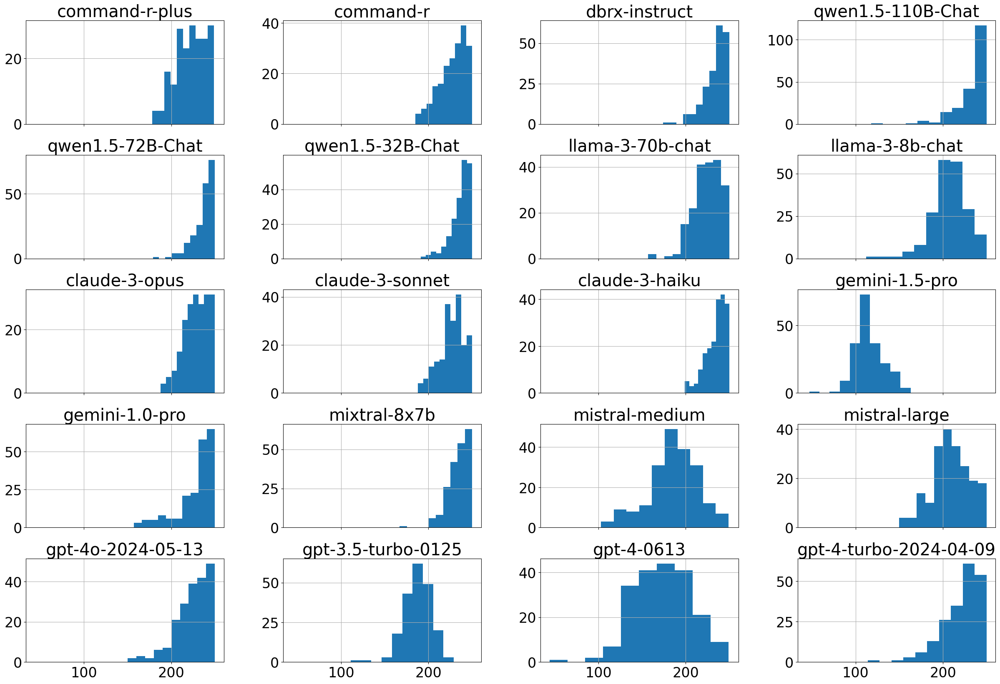

In [9]:
import matplotlib.pyplot as plt
import os


# Plot the distributions of the word counts of respondents.
plt.rcParams.update({"font.size": 24})
respondent_to_token_counts_df.hist(
    figsize=(30, 20),
    ylabelsize=24,
    xlabelsize=24,
    sharex=True,
)
plt.savefig(os.path.join(analysis_subdir_map["all_votes"]["length_bias"], "respondent_word_counts.pdf"))

## Plot outcomes as a function of word lengths.

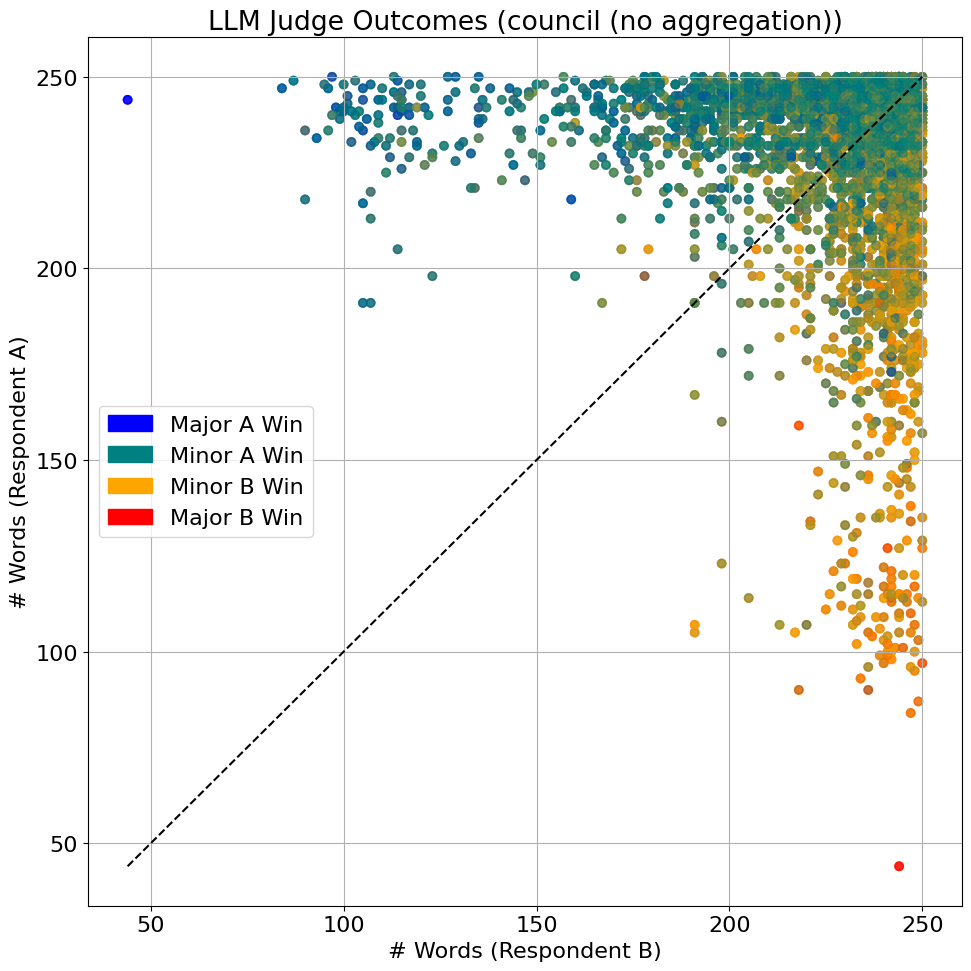

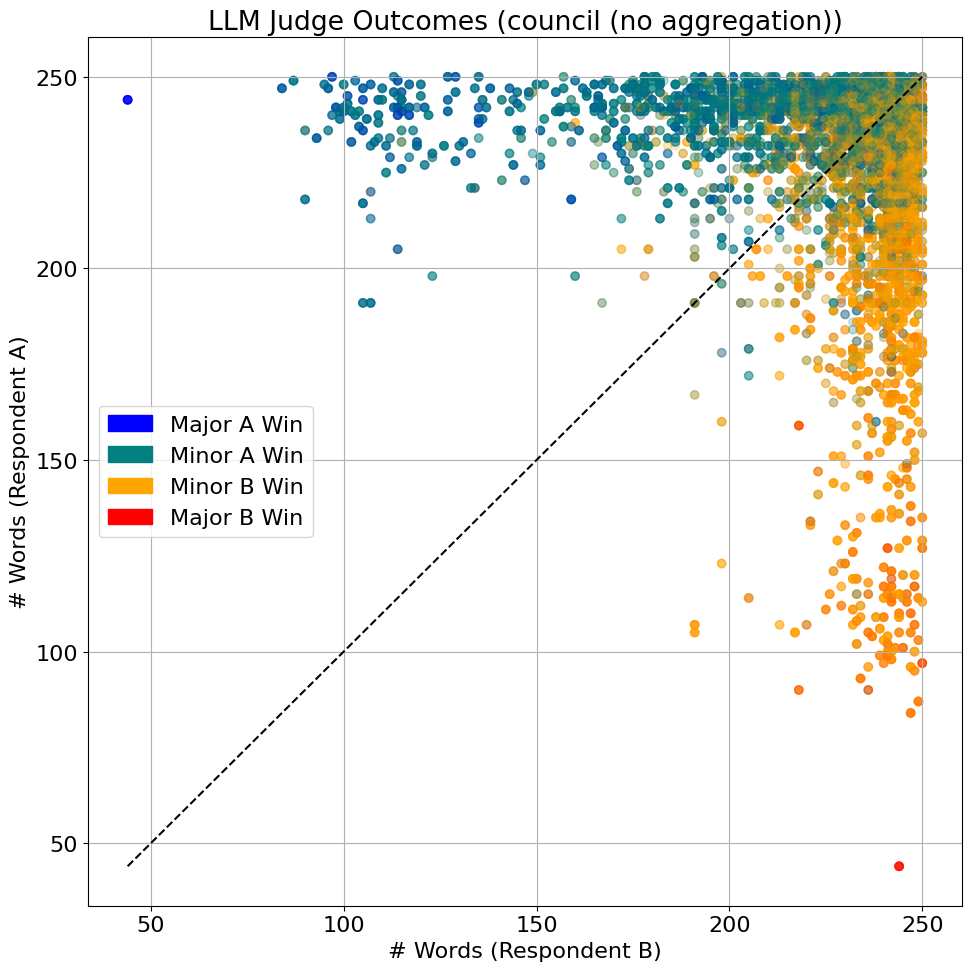

In [47]:
# Plot outcomes as a function of word lengths.
from llm_council.analysis.pairwise.pairwise_utils import get_council_choice


def plot_outcomes_by_respondent_word_lengths(judging_df, outdir):
    # Everyone's votes.
    plot_length_based_outcomes(judging_df, "council (no aggregation)", id_respondent_to_num_words, show=True, outdir=outdir)
    
    # Majority vote.
    council_choice_majority = get_council_choice(judging_df, "majority")
    plot_length_based_outcomes(
        council_choice_majority, "council (by majority vote)", id_respondent_to_num_words, show=False, outdir=outdir,
    )
    
    # Mean pooling.
    council_choice_mean_pooling = get_council_choice(judging_df, "mean_pooling")
    plot_length_based_outcomes(
        council_choice_mean_pooling, "council (by mean pooling)", id_respondent_to_num_words, show=False, outdir=outdir,
    )
    
    # Individual LLM judges.
    for judge in judging_df["llm_judge"].unique():
        judge_choice = judging_df[judging_df["llm_judge"] == judge]
        plot_length_based_outcomes(
            judge_choice, judge, id_respondent_to_num_words, show=False, outdir=outdir,
        )

# Plot outcomes by respondent word lengths.
plot_outcomes_by_respondent_word_lengths(judging_df, analysis_subdir_map["all_votes"]["length_bias"])
plot_outcomes_by_respondent_word_lengths(consistent_judging_df, analysis_subdir_map["consistent_votes"]["length_bias"])

## Use linear regression to measure length bias

In [50]:
from llm_council.analysis.pairwise.length_bias import get_length_biases_df

length_biases_consistent_votes_df = get_length_biases_df(consistent_judging_df, id_respondent_to_num_words)

length_biases_df = get_length_biases_df(judging_df, id_respondent_to_num_words)
length_biases_df.T

,length_bias
council (no aggregation),0.095056
council (majority vote),0.228591
council (mean pooling),0.328604
command-r-plus,0.162933
command-r,0.106573
dbrx-instruct,0.123520
qwen1.5-110B-Chat,0.167116
qwen1.5-72B-Chat,0.078270
qwen1.5-32B-Chat,0.088086
llama-3-70b-chat,0.158720


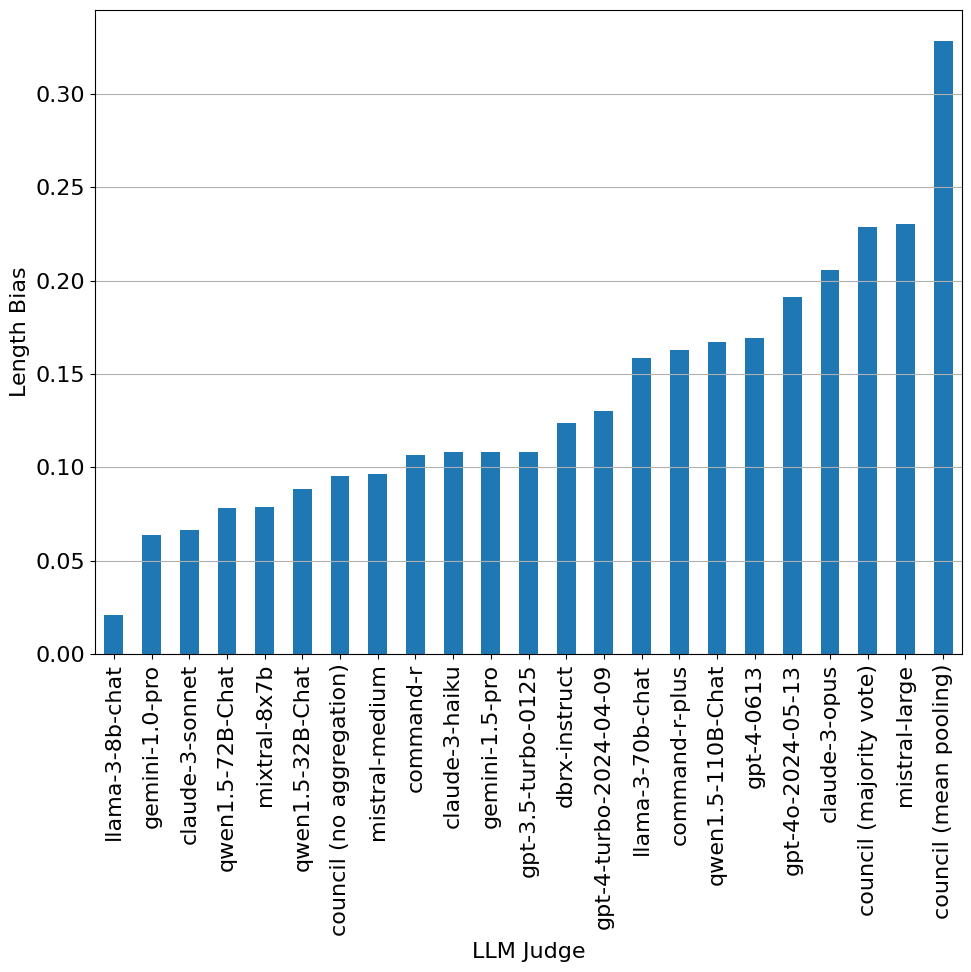

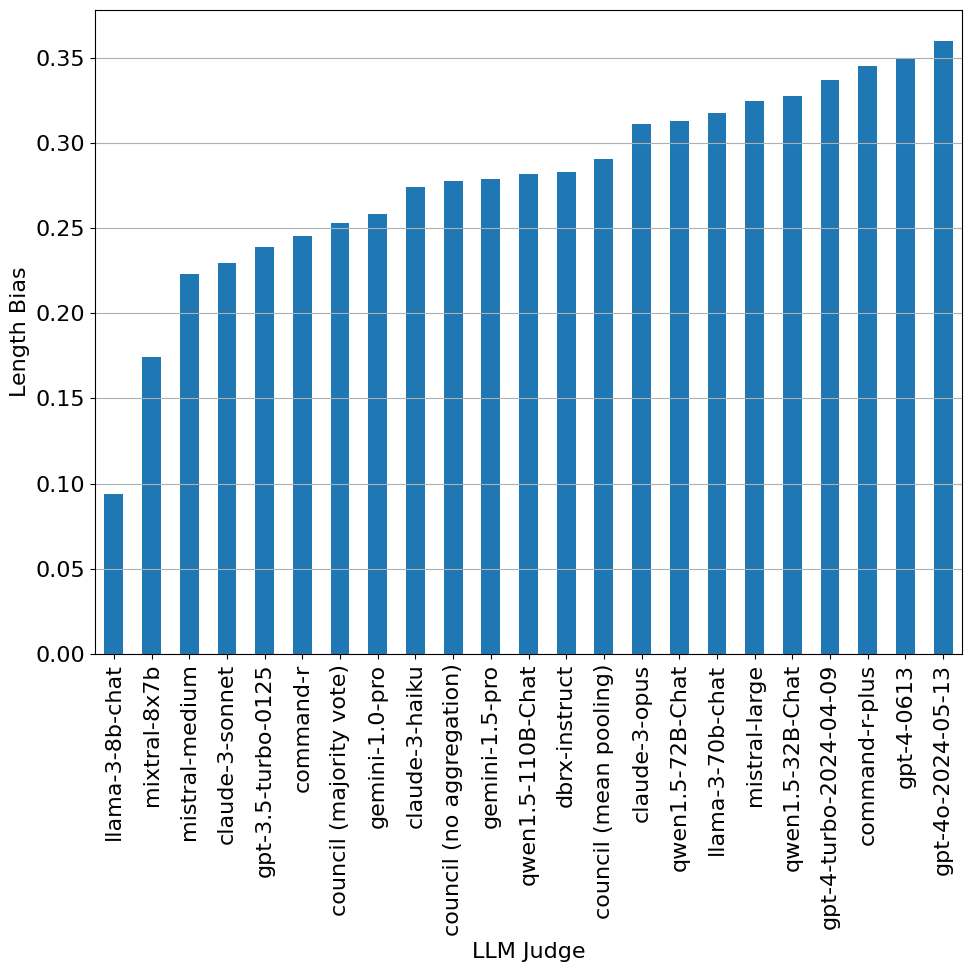

In [51]:
# Plot length bias.

def plot_length_bias_bar_graph(length_biases_df, outdir):
    length_biases_df = length_biases_df.T.sort_values("length_bias", ascending=True)
    length_biases_df.plot(kind="bar", figsize=(10, 10), legend=False)
    plt.xlabel("LLM Judge")
    plt.ylabel("Length Bias")
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.savefig(os.path.join(outdir, "length_bias.pdf"))
    plt.show()
    plt.close()


plot_length_bias_bar_graph(length_biases_df, analysis_subdir_map["all_votes"]["length_bias"])
plot_length_bias_bar_graph(length_biases_consistent_votes_df, analysis_subdir_map["consistent_votes"]["length_bias"])

# Pairwise Positional Consistency and Position Bias

Pairwise Positional Consistency (PPC) measures how often a judge gives consistent results when the order of the two model responses in a pairwise comparison is swapped (Appendix C.2). For instance, if the judge ranks A>B in one comparison and B>A when the positions are swapped (a battle couplet), the judge is considered "consistent" because the preference remained the same independent of position. Position bias measures how much the LLM judge favors a specific position (either the first or second) and we define it to be 
1 − 𝑝𝑝𝑐. On the 4-point preference scale, a battle couplet is still considered consistent as long as the relative ranking remains consistent overall — fine-grained differences such as (A>>B, B>A) or (B>>A, A>B) are tolerated. Table 10 lists all possible couplets and their consistency mappings. Conviction is the percentage of strong votes (A>>B or B>>A).

In [52]:
from llm_council.analysis.pairwise.consistency import (
    get_judge_invariability_df,
    get_judge_invariability_summary_df,
    get_judge_profiles_df)

## Invariability

Because in the LMC, we only collect one vote per judge per battle, the invariability and number of unique responses is inherently 100%.

In [55]:
invariability_consistent_df = get_judge_invariability_df(consistent_judging_df)
invariability_consistent_summary_df = get_judge_invariability_summary_df(
    invariability_consistent_df
)

invariability_df = get_judge_invariability_df(judging_df)
invariability_summary_df = get_judge_invariability_summary_df(
    invariability_df
)
invariability_summary_df

,mean_invariability,mean_num_unique_responses
llm_judge,,
claude-3-haiku,1.0,1.0
claude-3-opus,1.0,1.0
claude-3-sonnet,1.0,1.0
command-r,1.0,1.0
command-r-plus,1.0,1.0
dbrx-instruct,1.0,1.0
gemini-1.0-pro,1.0,1.0
gemini-1.5-pro,1.0,1.0
gpt-3.5-turbo-0125,1.0,1.0


## Calculate judge profiles

We provide a function, `get_judge_profiles_df()` to get the LLM judging profile, which calculates consistency and position bias.

In [56]:
import pandas as pd

consistent_judge_profiles_df = get_judge_profiles_df(consistent_judging_df)
consistent_judge_profiles_df = pd.concat([consistent_judge_profiles_df, invariability_summary_df], axis=1)

judge_profiles_df = get_judge_profiles_df(judging_df)
judge_profiles_df = pd.concat([judge_profiles_df, invariability_summary_df], axis=1)
judge_profiles_df

,inconsistency,consistency,repped_consistency,consistent_a_votes,consistent_b_votes,consistent_tie_votes,bias_towards_a,bias_towards_b,a_votes,b_votes,major_votes,minor_votes,major_a_votes,minor_a_votes,major_b_votes,minor_b_votes,tie_votes,mean_invariability,mean_num_unique_responses
command-r-plus,0.471053,0.528947,0.528947,0.264474,0.264474,0.0,0.450263,0.020263,0.714737,0.284737,0.009474,0.990000,0.001579,0.713158,0.007895,0.276842,0.000526,1.0,1.0
command-r,0.456842,0.543158,0.543158,0.271579,0.271579,0.0,0.072632,0.382105,0.344211,0.653684,0.197368,0.800526,0.009211,0.335000,0.188158,0.465526,0.002105,1.0,1.0
dbrx-instruct,0.546316,0.453684,0.453684,0.226842,0.226842,0.0,0.517632,0.028158,0.744474,0.255000,0.010526,0.988947,0.008421,0.736053,0.002105,0.252895,0.000526,1.0,1.0
qwen1.5-110B-Chat,0.318421,0.681579,0.681579,0.340789,0.340789,0.0,0.264737,0.053684,0.605526,0.394474,0.015789,0.984211,0.012895,0.592632,0.002895,0.391579,0.000000,1.0,1.0
qwen1.5-72B-Chat,0.734211,0.265789,0.265789,0.132895,0.132895,0.0,0.003158,0.730526,0.136053,0.863421,0.092895,0.906579,0.006316,0.129737,0.086579,0.776842,0.000526,1.0,1.0
qwen1.5-32B-Chat,0.761579,0.238421,0.238421,0.119211,0.119211,0.0,0.753684,0.006842,0.872895,0.126053,0.103947,0.895000,0.100263,0.772632,0.003684,0.122368,0.001053,1.0,1.0
llama-3-70b-chat,0.488947,0.511053,0.511053,0.255526,0.255526,0.0,0.469474,0.019474,0.725000,0.275000,0.153158,0.846842,0.082895,0.642105,0.070263,0.204737,0.000000,1.0,1.0
llama-3-8b-chat,0.738947,0.261053,0.261053,0.130526,0.130526,0.0,0.716842,0.022105,0.847368,0.152632,0.319211,0.680789,0.303158,0.544211,0.016053,0.136579,0.000000,1.0,1.0
claude-3-opus,0.252105,0.747895,0.747895,0.373947,0.373947,0.0,0.090000,0.162105,0.463947,0.536053,0.000789,0.999211,0.000263,0.463684,0.000526,0.535526,0.000000,1.0,1.0
claude-3-sonnet,0.601053,0.398947,0.398947,0.199474,0.199474,0.0,0.038947,0.562105,0.238421,0.761579,0.053684,0.946316,0.023421,0.215000,0.030263,0.731316,0.000000,1.0,1.0


## Plot judge profiles

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os


def plot_judge_profile(judge_profiles_df, outdir):
    df = judge_profiles_df
    df = df.sort_values("consistency", ascending=True)

    # Data preparation
    n_rows = df.shape[0]
    bar_height = 0.2
    gap = 0.1  # Gap between the first stack and the last stack in each group
    row_gap_factor = 1.8  # Factor to increase the gap between stack groups.
    y = np.arange(n_rows) * row_gap_factor  # Base positions for each index

    plt.rcParams.update({"font.size": 30})
    fig, ax = plt.subplots(
        figsize=(20, n_rows * row_gap_factor * 0.8)
    )  # Adjust the height of the figure

    for i in range(n_rows):
        base_y = y[i]  # Base position for the current index

        a_vote_rate = df["a_votes"].values[i]
        b_vote_rate = df["b_votes"].values[i]
        tie_vote_rate = df["tie_votes"].values[i]

        major_a_vote_rate = df["major_a_votes"].values[i]
        minor_a_vote_rate = df["minor_a_votes"].values[i]
        major_b_vote_rate = df["major_b_votes"].values[i]
        minor_b_vote_rate = df["minor_b_votes"].values[i]

        consistency_rate = df["consistency"].values[i]
        inconsistency_rate = df["inconsistency"].values[i]

        order_swapped_consistency_a_vote_rate = df[
            "consistent_a_votes"
        ].values[i]
        order_swapped_consistency_b_vote_rate = df[
            "consistent_b_votes"
        ].values[i]
        order_swapped_consistency_tie_vote_rate = df[
            "consistent_tie_votes"
        ].values[i]
        bias_toward_first = df["bias_towards_a"].values[i]
        bias_toward_second = df["bias_towards_b"].values[i]

        # Inconsistency breakdown.
        ax.barh(
            base_y - bar_height,
            bias_toward_first,
            bar_height,
            left=order_swapped_consistency_a_vote_rate
            + order_swapped_consistency_b_vote_rate
            + order_swapped_consistency_tie_vote_rate,
            label="Bias Towards A" if i == 0 else "",
            color="tab:pink",
        )
        ax.barh(
            base_y - bar_height,
            bias_toward_second,
            bar_height,
            left=order_swapped_consistency_a_vote_rate
            + order_swapped_consistency_b_vote_rate
            + order_swapped_consistency_tie_vote_rate
            + bias_toward_first,
            label="Bias Towards B" if i == 0 else "",
            color="tab:purple",
        )

        # Consistency
        ax.barh(
            base_y,
            consistency_rate,
            bar_height,
            label="Consistent Votes" if i == 0 else "",
            color="tab:gray",
        )
        ax.barh(
            base_y,
            inconsistency_rate,
            bar_height,
            left=consistency_rate,
            label="Inconsistent Votes" if i == 0 else "",
            color="tab:red",
        )

        # Consistency Breakdown
        ax.barh(
            base_y + bar_height,
            order_swapped_consistency_a_vote_rate,
            bar_height,
            color="tab:cyan",
            label="Consistent A Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height,
            order_swapped_consistency_b_vote_rate,
            bar_height,
            left=order_swapped_consistency_a_vote_rate,
            color="orange",
            label="Consistent B Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height,
            order_swapped_consistency_tie_vote_rate,
            bar_height,
            left=order_swapped_consistency_a_vote_rate
            + order_swapped_consistency_b_vote_rate,
            color="yellowgreen",
            label="Consistent Tie Votes" if i == 0 else "",
        )

        # Overall votes
        ax.barh(
            base_y + bar_height + bar_height + gap,
            a_vote_rate,
            bar_height,
            color="tab:blue",
            label="A Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height + bar_height + gap,
            b_vote_rate,
            bar_height,
            left=a_vote_rate,
            color="tab:orange",
            label="B Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height + bar_height + gap,
            tie_vote_rate,
            bar_height,
            left=a_vote_rate + b_vote_rate,
            color="tab:green",
            label="Tie Votes" if i == 0 else "",
        )

        # Granular overall votes.
        ax.barh(
            base_y + bar_height + bar_height + bar_height + gap,
            major_a_vote_rate,
            bar_height,
            color="blue",
            label="Major A Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height + bar_height + bar_height + gap,
            minor_a_vote_rate,
            bar_height,
            left=major_a_vote_rate,
            color="lightblue",
            label="Minor A Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height + bar_height + bar_height + gap,
            major_b_vote_rate,
            bar_height,
            left=major_a_vote_rate + minor_a_vote_rate,
            color="tab:brown",
            label="Major B Votes" if i == 0 else "",
        )
        ax.barh(
            base_y + bar_height + bar_height + bar_height + gap,
            minor_b_vote_rate,
            bar_height,
            left=major_a_vote_rate + minor_a_vote_rate + major_b_vote_rate,
            color="moccasin",
            label="Minor B Votes" if i == 0 else "",
        )

    # Adding labels and title
    ax.set_ylabel("Judge")
    ax.set_xlabel("Rate")
    ax.set_yticks(y)
    ax.set_yticklabels(df.index)

    # Legend
    handles, labels = ax.get_legend_handles_labels()

    # Create a dictionary to map the labels to their handles
    handles_labels = dict(zip(labels, handles))

    # Specify the desired order of the labels
    order = [
        "A Votes",
        "Major A Votes",
        "Minor A Votes",
        "Consistent A Votes",
        "B Votes",
        "Major B Votes",
        "Minor B Votes",
        "Consistent B Votes",
        "Tie Votes",
        "Consistent Tie Votes",
        "Consistent Votes",
        "Inconsistent Votes",
        "Bias Towards A",
        "Bias Towards B",
    ]

    # Create the legend with the specified order
    ax.legend(
        [handles_labels[label] for label in order],
        order,
        loc="upper left",
        bbox_to_anchor=(1, 1),
    )
    plt.tight_layout()
    plt.savefig(os.path.join(outdir, f"judge_rating_profile.pdf"))

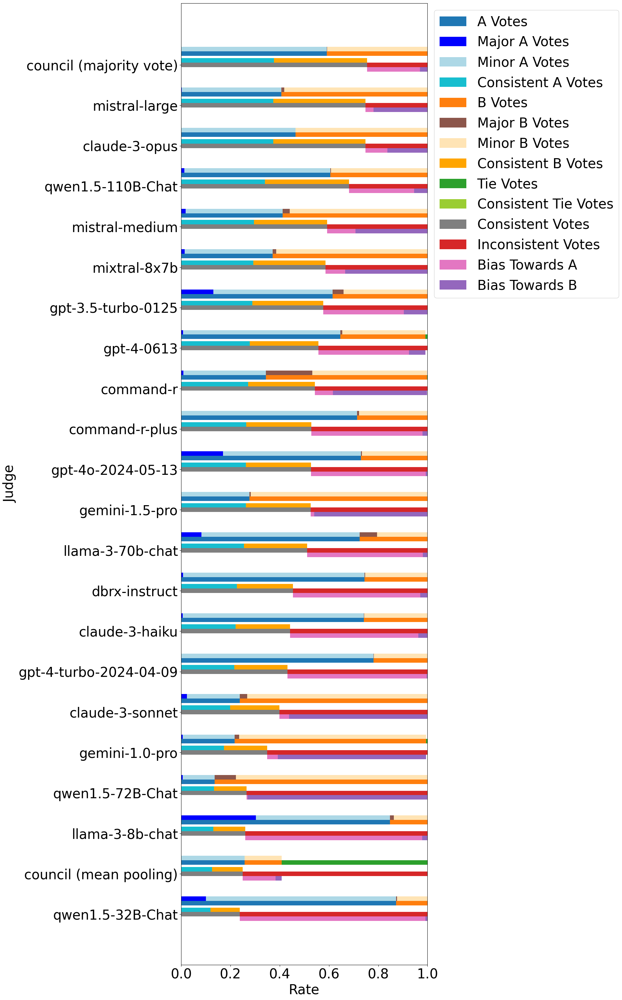

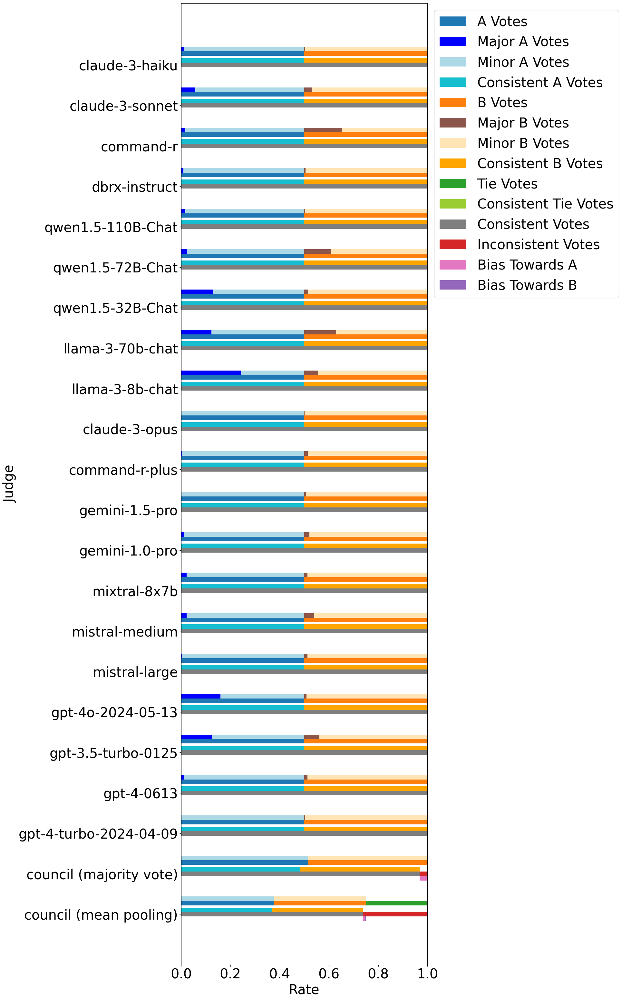

In [58]:
plot_judge_profile(judge_profiles_df, analysis_subdir_map["all_votes"]["consistency_and_position_bias"])
plot_judge_profile(consistent_judge_profiles_df, analysis_subdir_map["consistent_votes"]["consistency_and_position_bias"])

# Affinity

Which LLMs like which other LLMs?

In [2]:
from llm_council.analysis.pairwise.affinity import get_affinity_df

In [24]:
affinity_results = get_affinity_df(judging_df, reference_llm_respondent="qwen1.5-32B-Chat")
affinity_results_consistent_votes = get_affinity_df(consistent_judging_df, reference_llm_respondent="qwen1.5-32B-Chat")

## Affinity heatmap

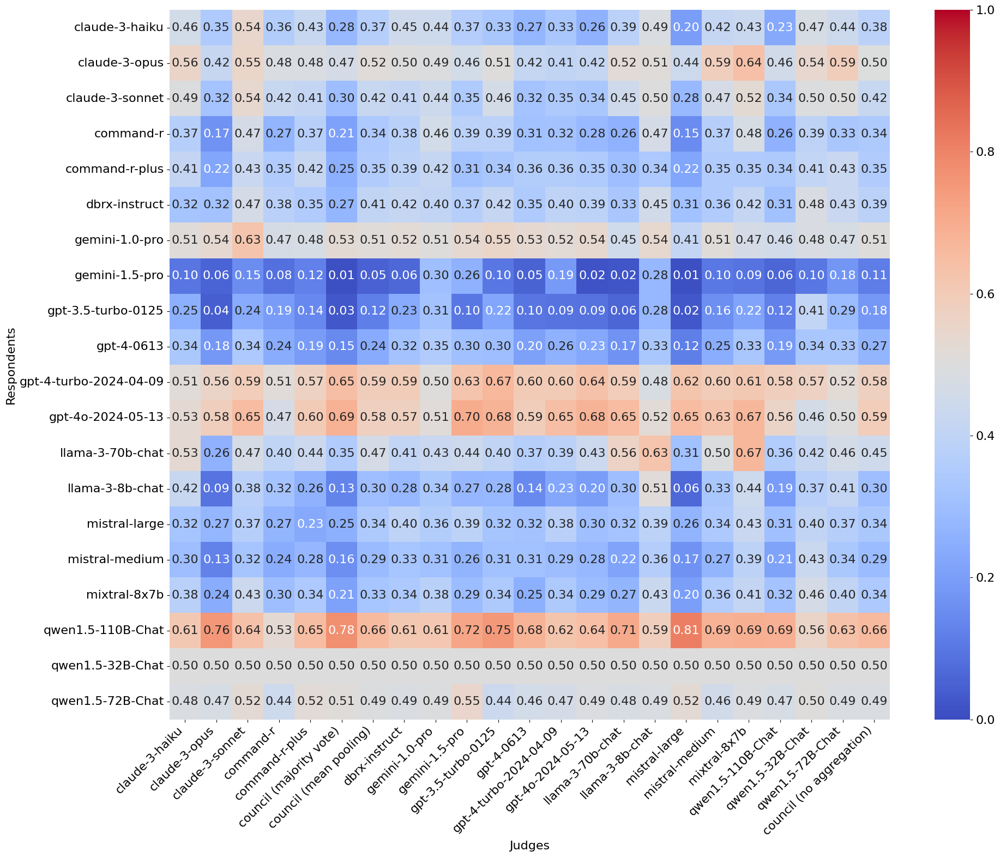

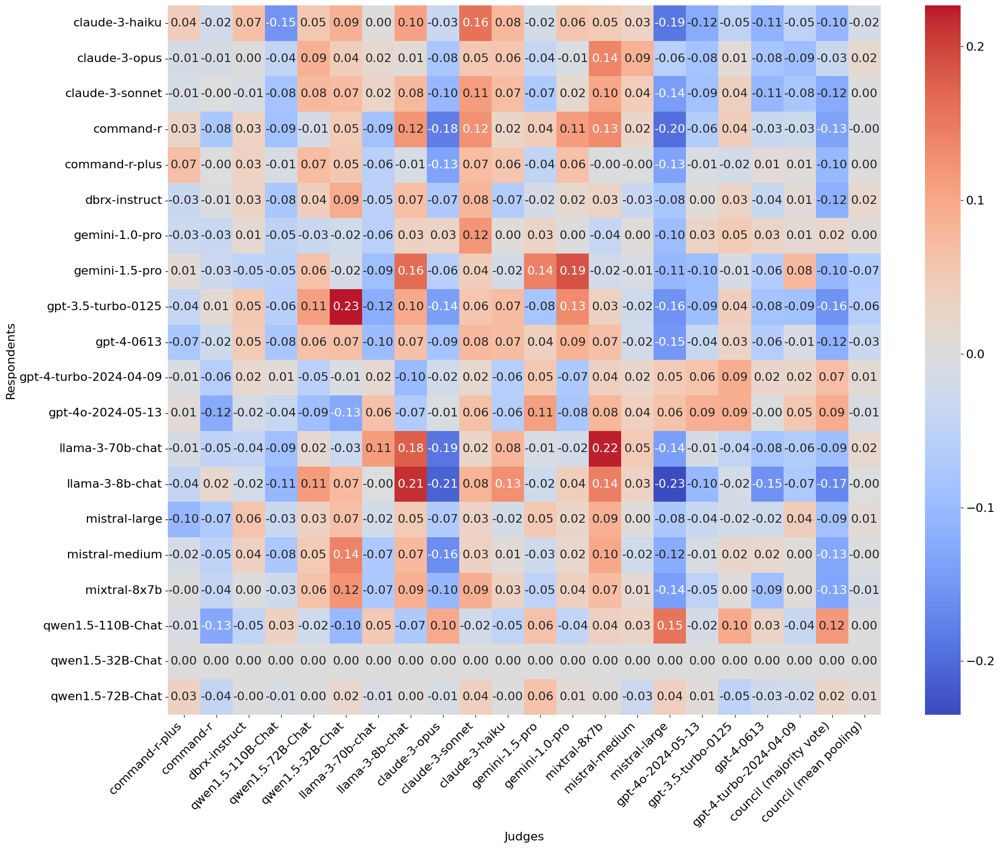

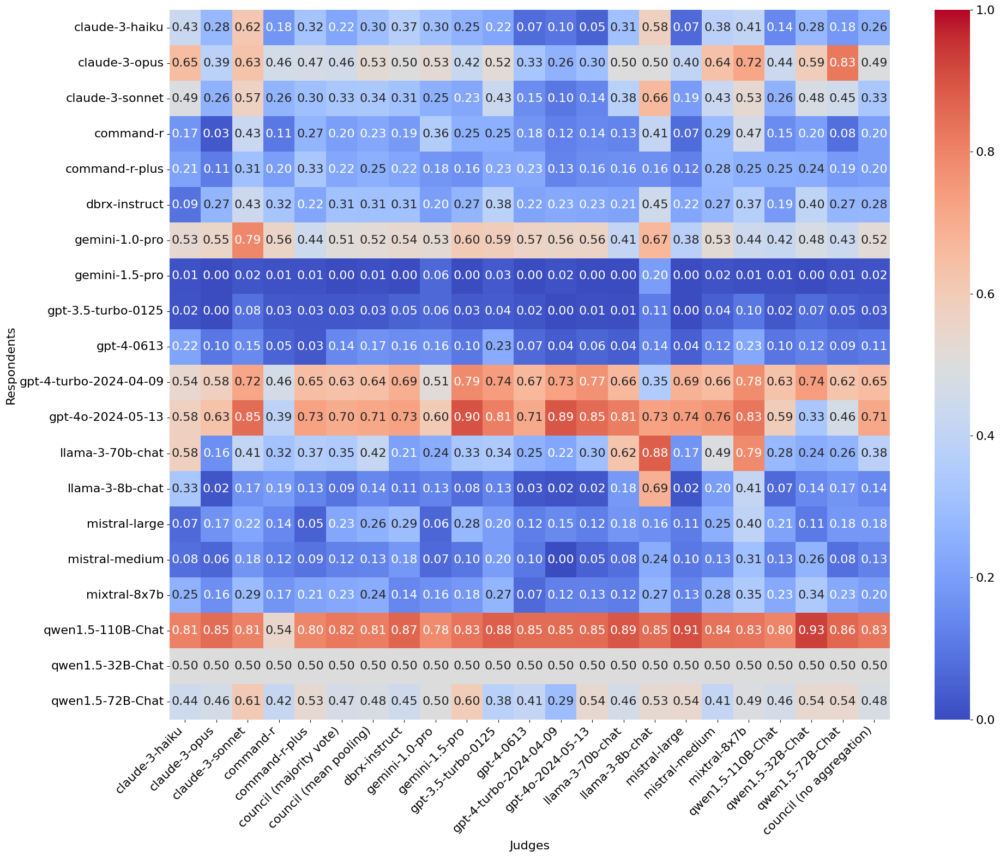

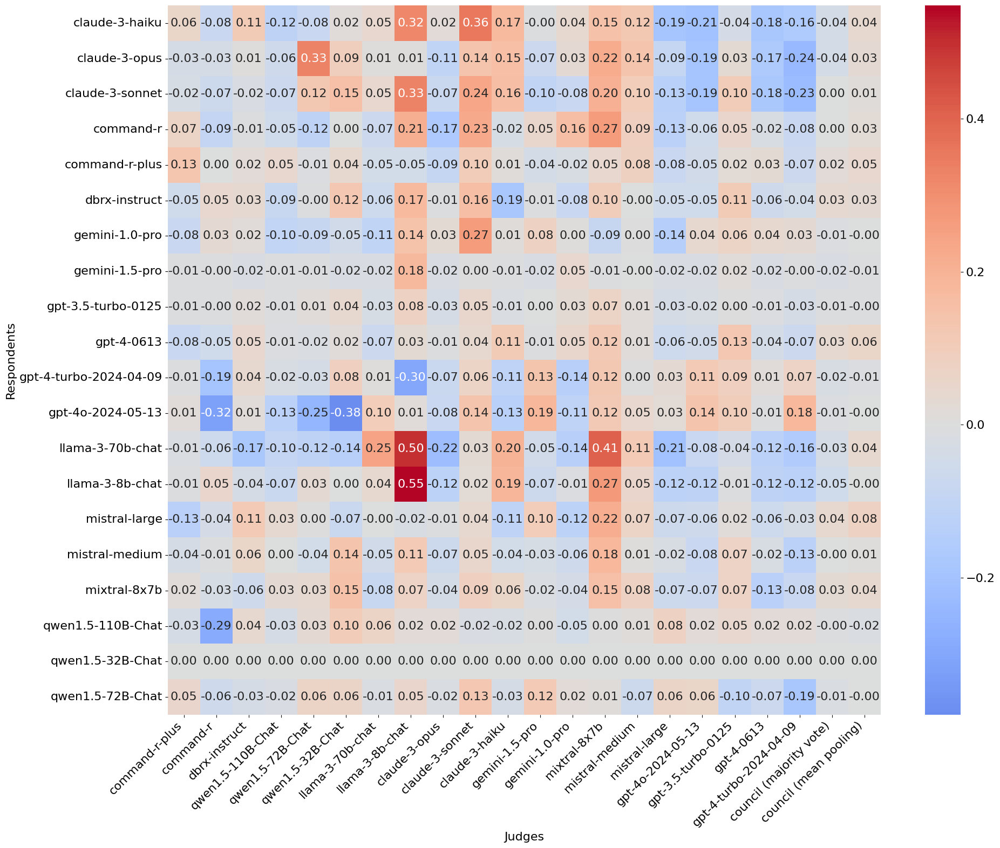

In [26]:
plot_heatmap(
    affinity_results["judge_preferences"],
    ylabel="Respondents",
    xlabel="Judges",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["all_votes"]["affinity"], "raw_preferences.pdf"),
    font_size=16,
)

plot_heatmap(
    affinity_results["judge_preferences_council_normalized"],
    ylabel="Respondents",
    xlabel="Judges",
    center=0,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["all_votes"]["affinity"], "normalized_preferences.pdf"),
    font_size=16,
)

plot_heatmap(
    affinity_results_consistent_votes["judge_preferences"],
    ylabel="Respondents",
    xlabel="Judges",
    vmin=0,
    vmax=1,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["consistent_votes"]["affinity"], "raw_preferences.pdf"),
    font_size=16,
)

plot_heatmap(
    affinity_results_consistent_votes["judge_preferences_council_normalized"],
    ylabel="Respondents",
    xlabel="Judges",
    center=0,
    cmap="coolwarm",
    outfile=os.path.join(analysis_subdir_map["consistent_votes"]["affinity"], "normalized_preferences.pdf"),
    font_size=16,
)

## Self-enhancement bias

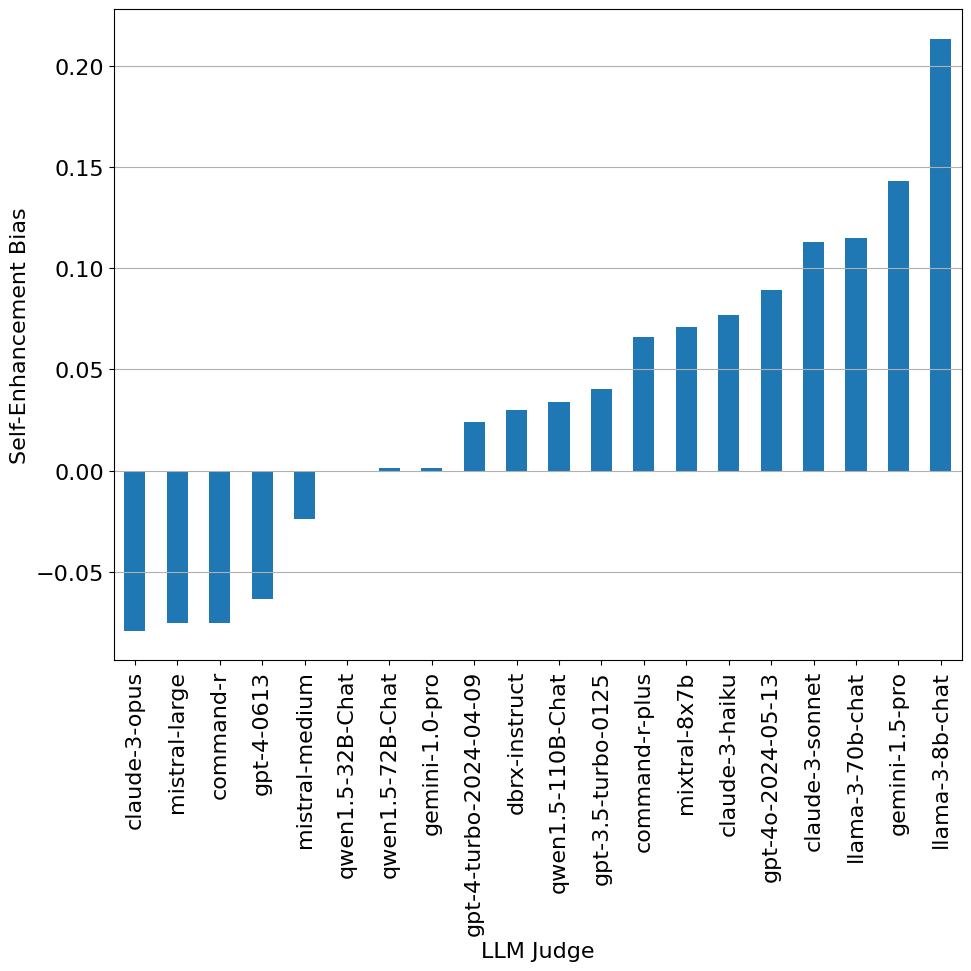

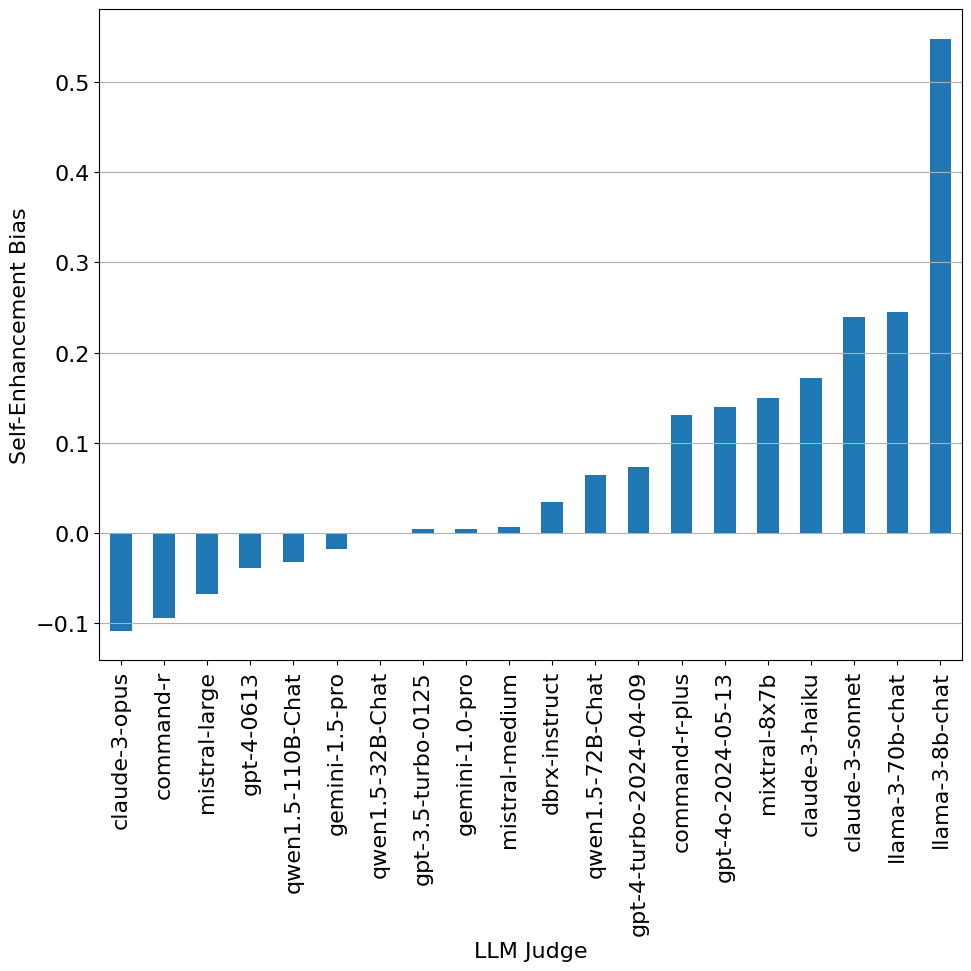

In [44]:
import pandas as pd

def plot_self_enhancement_bias_bar_graph(self_enhancement_bias_df, outdir):
    self_enhancement_bias_df = self_enhancement_bias_df.sort_values("bias", ascending=True)
    self_enhancement_bias_df.plot(kind="bar", figsize=(10, 10), legend=False)
    plt.xlabel("LLM Judge")
    plt.ylabel("Self-Enhancement Bias")
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.savefig(os.path.join(outdir, "self_enhancement_bias.pdf"))
    plt.show()
    plt.close()


plot_self_enhancement_bias_bar_graph(pd.DataFrame(affinity_results["self_enhancement_bias"].T), analysis_subdir_map["all_votes"]["affinity"])
plot_self_enhancement_bias_bar_graph(pd.DataFrame(affinity_results_consistent_votes["self_enhancement_bias"].T), analysis_subdir_map["consistent_votes"]["affinity"])

# Separability

In [31]:
from llm_council.analysis.pairwise.separability import analyze_rankings_separability_polarization

In [50]:
# Turn off individual judges or decrease the bootstrap rounds to make this run faster. The published paper uses bootstrap_rounds=100.
rankings_results = analyze_rankings_separability_polarization(
    judging_df,
    reference_llm_respondent="qwen1.5-32B-Chat",
    bootstrap_rounds=10,
    include_individual_judges=True,
    include_council_majority=True,
    include_council_mean_pooling=True,
    include_council_no_aggregation=True,
)

rankings_results_consistent_votes = analyze_rankings_separability_polarization(
    consistent_judging_df,
    reference_llm_respondent="qwen1.5-32B-Chat",
    bootstrap_rounds=10,
    include_individual_judges=True,
    include_council_majority=True,
    include_council_mean_pooling=True,
    include_council_no_aggregation=True,
)

bootstrap:  40%|██████████████████████████████                                             | 4/10 [00:00<00:00, 16.62it/s]/Users/justinzhao/Repos/llm-council-public/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
bootstrap: 100%|██████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 21.19it/s]


In [51]:
import matplotlib.pyplot as plt
import seaborn as sns


FAMILY_COLORS = {
    "OpenAI": "mediumseagreen",
    "Anthropic": "burlywood",
    "Mistral": "darkorange",
    "Google": "skyblue",
    "Meta": "magenta",
    "Cohere": "coral",
    "Cohere": "darkslategray",
    "Databricks": "orangered",
    "Alibaba": "slateblue",
    "Council": "gold",
    "Human Generic": "black",
}


FAMILY_MAPPING = {
    # OpenAI
    "gpt-3.5-turbo": "OpenAI",
    "gpt-3.5-turbo-0125": "OpenAI",
    "gpt-4-turbo-2024-04-09": "OpenAI",
    "gpt-4o-2024-05-13": "OpenAI",
    "gpt-4-0125": "OpenAI",
    "gpt-4-0613": "OpenAI",
    # Google
    # "gemini-pro": "Google",
    "gemini-1.0-pro": "Google",
    "gemini-1.5-pro": "Google",
    # Anthropic
    "claude-3-sonnet": "Anthropic",
    "claude-3-opus": "Anthropic",
    "claude-3-haiku": "Anthropic",
    # Meta
    "llama-3-70b-chat": "Meta",
    "llama-3-8b-chat": "Meta",
    # Mistral
    "mistral-large": "Mistral",
    "mistral-medium": "Mistral",
    "mistral-small": "Mistral",
    "mixtral-8x7b": "Mistral",
    # Alibaba
    "qwen1.5-32B-Chat": "Alibaba",
    "qwen1.5-72B-Chat": "Alibaba",
    "qwen1.5-110B-Chat": "Alibaba",
    # DBRX
    "dbrx-instruct": "Databricks",
    # Cohere
    "command-r-plus": "Cohere",
    "command-r": "Cohere",
    # Special
    "council (majority vote)": "Council",
    "council (mean pooling)": "Council",
    "council (no aggregation)": "Council",
}


def print_expected_win_rates(stats):
    """Prints the ELO scores with 95% confidence intervals."""
    decimal = 1
    for _, row in stats.iterrows():
        interval = str(
            (
                round(row["lower"] - row["score"], decimal),
                round(row["upper"] - row["score"], decimal),
            )
        )
        print(
            f"{row['model'] : <30} | score: {round(row['score'], decimal) : ^5} | 95% CI: {interval : ^12}"
        )


def plot_arena_hard_elo_stats(stats, title, outfile, show=False):
    # Mapping and error calculations
    stats["family"] = stats["model"].map(FAMILY_MAPPING)
    stats["lower_error"] = stats["score"] - stats["lower"]
    stats["upper_error"] = stats["upper"] - stats["score"]
    errors = stats[["lower_error", "upper_error"]].T.values

    # Create the plot with larger fonts
    plt.figure(figsize=(10, 8))

    # Increase font size globally
    plt.rcParams.update({"font.size": 16})

    ax = sns.barplot(
        data=stats,
        y="model",
        x="score",
        hue="family",
        palette=FAMILY_COLORS,
    )

    # Add error bars
    for i, (score, error) in enumerate(zip(stats["score"], errors.T)):
        try:
            ax.errorbar(
                score, i, xerr=[error[:1], error[1:]], fmt="none", c="black", capsize=5
            )
        except Exception as e:
            print(
                f"Error bars aren't valid: {error[:1], error[1:]}. This can happen due to bad bootstrap sampling, particularly in low data scenarios. Skipping."
            )
        plt.text(score + error[1:] + 1, i, f"{score}", va="center", color="black")

    # Disable the legend.
    # ax.get_legend().remove()
    
    plt.title(title)
    plt.xlabel("Win Rate")
    plt.ylabel("")
    plt.grid(axis="x", linestyle="--")
    plt.legend(title="Family", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=16)
    plt.xlim(right=stats["score"].max() + 20)
    plt.tight_layout()

    # Save to file if specified
    if outfile:
        plt.savefig(outfile)
    if show:
        plt.show()
    plt.close()

In [52]:
print_expected_win_rates(rankings_results["council (majority vote)"]["elo_scores"])

qwen1.5-110B-Chat              | score: 77.5  | 95% CI: (-5.7, 1.1) 
gpt-4o-2024-05-13              | score: 68.5  | 95% CI: (-6.6, 2.4) 
gpt-4-turbo-2024-04-09         | score: 64.5  | 95% CI: (-8.2, 4.0) 
gemini-1.0-pro                 | score: 52.5  | 95% CI: (-7.1, 6.5) 
qwen1.5-72B-Chat               | score: 51.0  | 95% CI: (-6.8, 3.8) 
qwen1.5-32B-Chat               | score: 50.0  | 95% CI:  (0.0, 0.0) 
claude-3-opus                  | score: 46.5  | 95% CI: (-7.5, 2.9) 
llama-3-70b-chat               | score: 35.5  | 95% CI: (-6.4, 4.1) 
claude-3-sonnet                | score: 30.0  | 95% CI: (-5.7, 3.0) 
claude-3-haiku                 | score: 28.0  | 95% CI: (-7.7, 4.8) 
dbrx-instruct                  | score: 27.0  | 95% CI: (-1.8, 4.8) 
command-r-plus                 | score: 25.0  | 95% CI: (-4.5, 4.5) 
mistral-large                  | score: 25.0  | 95% CI: (-6.1, 6.9) 
command-r                      | score: 21.0  | 95% CI: (-4.6, 2.6) 
mixtral-8x7b                   | s

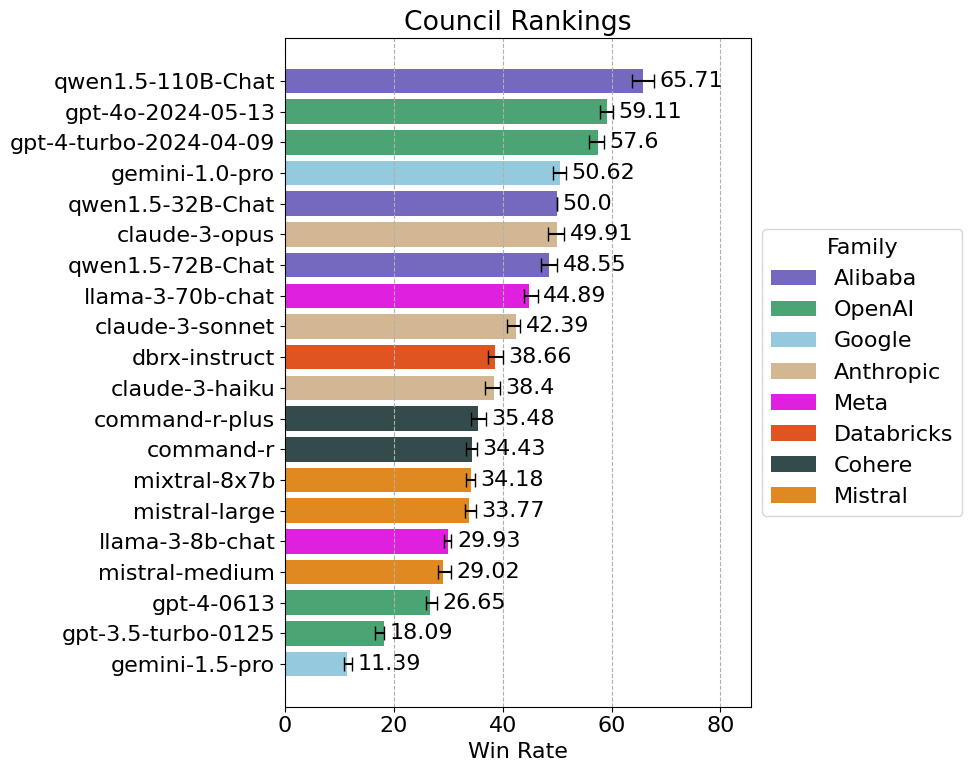

Error bars aren't valid: (array([-0.23]), array([7.82])). This can happen due to bad bootstrap sampling, particularly in low data scenarios. Skipping.
Error bars aren't valid: (array([-1.14]), array([10.26])). This can happen due to bad bootstrap sampling, particularly in low data scenarios. Skipping.
Error bars aren't valid: (array([-1.68]), array([8.67])). This can happen due to bad bootstrap sampling, particularly in low data scenarios. Skipping.


In [53]:
plot_arena_hard_elo_stats(rankings_results["council (no aggregation)"]["elo_scores"], "Council Rankings", None, show=True)

# Save plots to disk (all votes).
for ranking_key in rankings_results.keys():
    plot_arena_hard_elo_stats(
        rankings_results[ranking_key]["elo_scores"], 
        "", 
        os.path.join(analysis_subdir_map["all_votes"]["rankings_and_separability"], 
                     f"{ranking_key}.pdf"))

# Save plots to disk (consistent votes).
for ranking_key in rankings_results_consistent_votes.keys():
    plot_arena_hard_elo_stats(
        rankings_results_consistent_votes[ranking_key]["elo_scores"], 
        "", 
        os.path.join(analysis_subdir_map["consistent_votes"]["rankings_and_separability"], 
                     f"{ranking_key}.pdf"))